In [2]:
import numpy as np
import seaborn as sns
import pandas as pd
from matplotlib import colormaps
import time
import matplotlib.pyplot as plt
from matplotlib import colors
import scipy.spatial as scsp
from pyriemann.estimation import XdawnCovariances, Xdawn, Covariances, covariances_EP


from scipy.spatial import Delaunay


# Visualize the data before classifier and between the layers

## load the data already visualised

In [2]:
preclassif_nrc = np.load("../results/Visualisation/Castillos/predata_nrc.npy")
preclassif_rc = np.load("../results/Visualisation/Castillos/predata_rc.npy")
preclassif_nrc1 = np.load("../results/Visualisation/Castillos/predata_nrc_1.npy")
preclassif_rc1 = np.load("../results/Visualisation/Castillos/predata_rc_1.npy")
preclassif_nrc_riem = np.load("../results/Visualisation/Castillos/predata_nrc_riem.npy")
preclassif_rc_riem = np.load("../results/Visualisation/Castillos/predata_rc_riem.npy")

preclassif_nrc_code = np.load("../results/Visualisation/Castillos/predata_nrc_code.npy")
preclassif_rc_code = np.load("../results/Visualisation/Castillos/predata_rc_code.npy")
preclassif_nrc_riem_code = np.load("../results/Visualisation/Castillos/predata_nrc_riem_code.npy")
preclassif_rc_riem_code = np.load("../results/Visualisation/Castillos/predata_rc_riem_code.npy")

In [3]:
preclassif_nrc.shape

(3600, 2)

## general info

In [4]:
subjects = [1,2,3,4,5,6,7,8,9,10,11,12]
n_samples = 150
n_samples_code = 100

## Simple plot

C:\Users\s.velut\AppData\Local\Temp\ipykernel_19760\1856495357.py:3: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(preclassif_nrc[i*n_samples*2:(i+1)*n_samples*2,0], preclassif_nrc[i*n_samples*2:(i+1)*n_samples*2,1],label="sub{}".format(i),c=c,alpha=0.5)
C:\Users\s.velut\AppData\Local\Temp\ipykernel_19760\1856495357.py:8: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(preclassif_rc[i*n_samples*2:(i+1)*

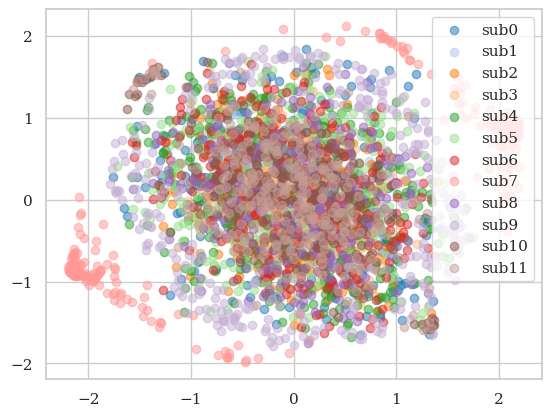

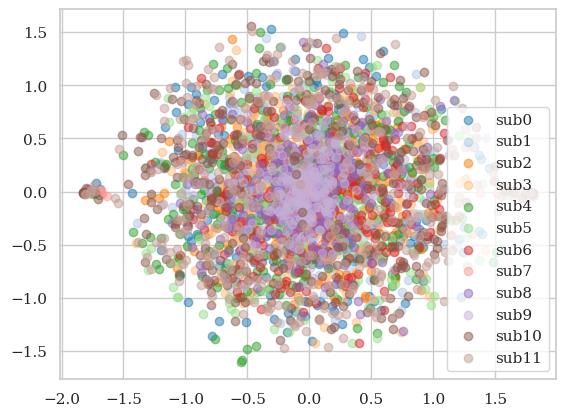

In [75]:
plt.figure(1)
for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    plt.scatter(preclassif_nrc[i*n_samples*2:(i+1)*n_samples*2,0], preclassif_nrc[i*n_samples*2:(i+1)*n_samples*2,1],label="sub{}".format(i),c=c,alpha=0.5)
plt.legend()

plt.figure(2)
for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    plt.scatter(preclassif_rc[i*n_samples*2:(i+1)*n_samples*2,0], preclassif_rc[i*n_samples*2:(i+1)*n_samples*2,1],label="sub{}".format(i),c=c,alpha=0.5)
plt.legend()

plt.show()

C:\Users\s.velut\AppData\Local\Temp\ipykernel_19760\164613081.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(preclassif_nrc[i*n_samples*2:(2*i+1)*n_samples,0], preclassif_nrc[i*n_samples*2:(2*i+1)*n_samples,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c,alpha=0.5)
C:\Users\s.velut\AppData\Local\Temp\ipykernel_19760\164613081.py:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(preclassif_nrc1[i*

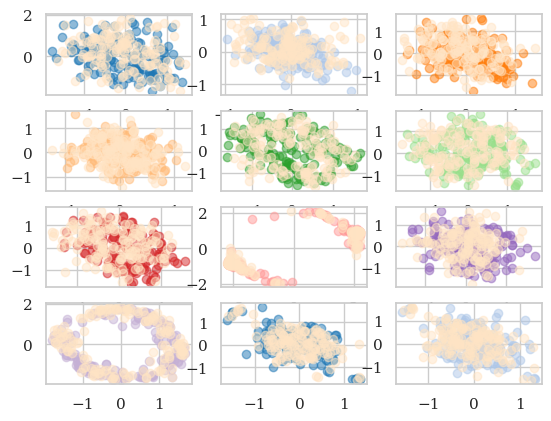

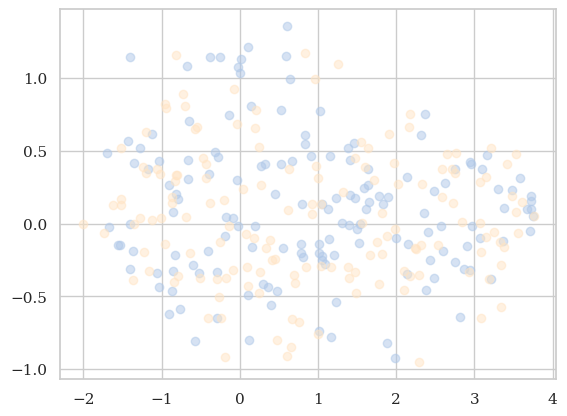

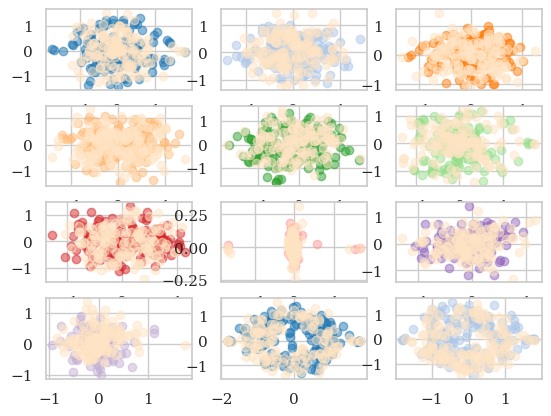

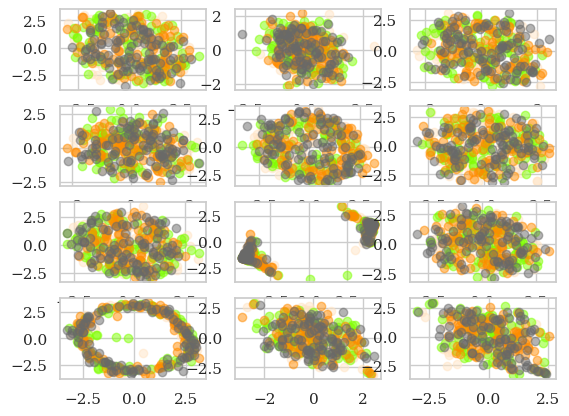

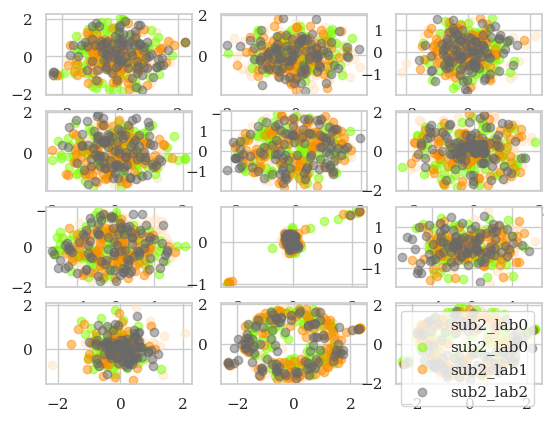

In [78]:
plt.figure(1)
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[i%10]
    c2 = list(colors.CSS4_COLORS)[6]
    plt.scatter(preclassif_nrc[i*n_samples*2:(2*i+1)*n_samples,0], preclassif_nrc[i*n_samples*2:(2*i+1)*n_samples,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c,alpha=0.5)
    plt.scatter(preclassif_nrc[n_samples*(2*i+1):(i+1)*n_samples*2,0], preclassif_nrc[n_samples*(2*i+1):(i+1)*n_samples*2,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c2,alpha=0.5)
# plt.legend()
    
plt.figure(5)
i=0
plt.scatter(preclassif_nrc1[i*n_samples*2:(2*i+1)*n_samples,0], preclassif_nrc1[i*n_samples*2:(2*i+1)*n_samples,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=sns.color_palette("tab20", 20)[1],alpha=0.5)
plt.scatter(preclassif_nrc1[n_samples*(2*i+1):(i+1)*n_samples*2,0], preclassif_nrc1[n_samples*(2*i+1):(i+1)*n_samples*2,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c2,alpha=0.5)


plt.figure(2)
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[i%10]
    c2 = list(colors.CSS4_COLORS)[6]
    plt.scatter(preclassif_rc[i*n_samples*2:(2*i+1)*n_samples,0], preclassif_rc[i*n_samples*2:(2*i+1)*n_samples,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c,alpha=0.5)
    plt.scatter(preclassif_rc[n_samples*(2*i+1):(i+1)*n_samples*2,0], preclassif_rc[n_samples*(2*i+1):(i+1)*n_samples*2,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c2,alpha=0.5)
# plt.legend()


plt.figure(3)
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    c1 = list(colors.CSS4_COLORS)[6]
    c2 = list(colors.CSS4_COLORS)[14]
    c3 = list(colors.CSS4_COLORS)[30]
    c4 = list(colors.CSS4_COLORS)[42]
    plt.scatter(preclassif_nrc_code[i*n_samples_code*4:(4*i+1)*n_samples_code,0], preclassif_nrc_code[i*n_samples_code*4:(4*i+1)*n_samples_code,1],label="sub{}_lab{}".format(i//4,(i+1)%4),c=c1,alpha=0.5)
    plt.scatter(preclassif_nrc_code[n_samples_code*(4*i+1):(4*i+2)*n_samples_code,0], preclassif_nrc_code[n_samples_code*(4*i+1):(4*i+2)*n_samples_code,1],label="sub{}_lab{}".format(i//4,(i+1)%4),c=c2,alpha=0.5)
    plt.scatter(preclassif_nrc_code[n_samples_code*(4*i+2):(4*i+3)*n_samples_code,0], preclassif_nrc_code[n_samples_code*(4*i+2):(4*i+3)*n_samples_code,1],label="sub{}_lab{}".format(i//4,(i+2)%4),c=c3,alpha=0.5)
    plt.scatter(preclassif_nrc_code[n_samples_code*(4*i+3):(i+1)*n_samples_code*4,0], preclassif_nrc_code[n_samples_code*(4*i+3):(i+1)*n_samples_code*4,1],label="sub{}_lab{}".format(i//4,(i+3)%4),c=c4,alpha=0.5)

plt.figure(4)
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    c1 = list(colors.CSS4_COLORS)[6]
    c2 = list(colors.CSS4_COLORS)[14]
    c3 = list(colors.CSS4_COLORS)[30]
    c4 = list(colors.CSS4_COLORS)[42]
    plt.scatter(preclassif_rc_code[i*n_samples_code*4:(4*i+1)*n_samples_code,0], preclassif_rc_code[i*n_samples_code*4:(4*i+1)*n_samples_code,1],label="sub{}_lab{}".format(i//4,(i+1)%4),c=c1,alpha=0.5)
    plt.scatter(preclassif_rc_code[n_samples_code*(4*i+1):(4*i+2)*n_samples_code,0], preclassif_rc_code[n_samples_code*(4*i+1):(4*i+2)*n_samples_code,1],label="sub{}_lab{}".format(i//4,(i+1)%4),c=c2,alpha=0.5)
    plt.scatter(preclassif_rc_code[n_samples_code*(4*i+2):(4*i+3)*n_samples_code,0], preclassif_rc_code[n_samples_code*(4*i+2):(4*i+3)*n_samples_code,1],label="sub{}_lab{}".format(i//4,(i+2)%4),c=c3,alpha=0.5)
    plt.scatter(preclassif_rc_code[n_samples_code*(4*i+3):(i+1)*n_samples_code*4,0], preclassif_rc_code[n_samples_code*(4*i+3):(i+1)*n_samples_code*4,1],label="sub{}_lab{}".format(i//4,(i+3)%4),c=c4,alpha=0.5)
plt.legend()

plt.show()

C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\3202585062.py:3: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(preclassif_nrc_riem[i*n_samples*2:(i+1)*n_samples*2,0], preclassif_nrc_riem[i*n_samples*2:(i+1)*n_samples*2,1],label="sub{}".format(i),c=c,alpha=0.5)
C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\3202585062.py:8: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(preclassif_rc_riem[i*n_sam

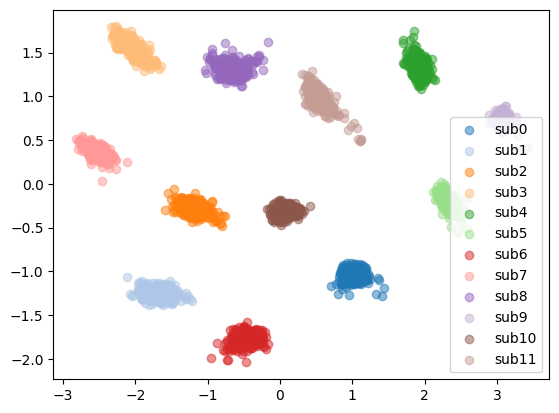

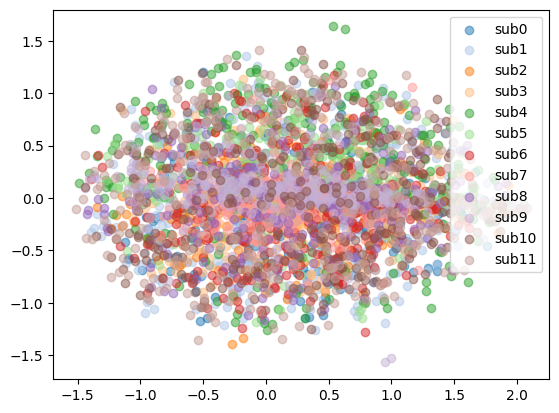

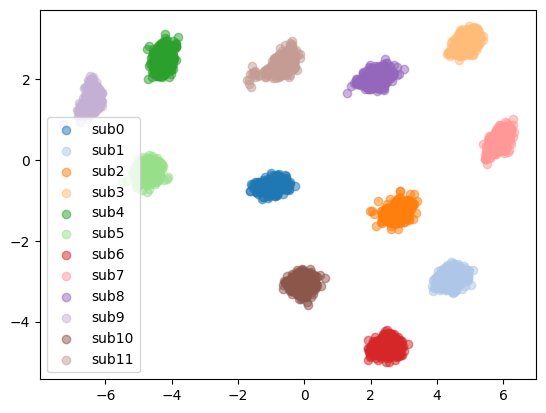

In [15]:
plt.figure(1)
for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    plt.scatter(preclassif_nrc_riem[i*n_samples*2:(i+1)*n_samples*2,0], preclassif_nrc_riem[i*n_samples*2:(i+1)*n_samples*2,1],label="sub{}".format(i),c=c,alpha=0.5)
plt.legend()

plt.figure(2)
for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    plt.scatter(preclassif_rc_riem[i*n_samples*2:(i+1)*n_samples*2,0], preclassif_rc_riem[i*n_samples*2:(i+1)*n_samples*2,1],label="sub{}".format(i),c=c,alpha=0.5)
plt.legend()

plt.figure(3)
for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    plt.scatter(preclassif_nrc_riem_code[i*n_samples_code*4:(i+1)*n_samples_code*4,0], preclassif_nrc_riem_code[i*n_samples_code*4:(i+1)*n_samples_code*4,1],label="sub{}".format(i),c=c,alpha=0.5)
plt.legend()

plt.show()

C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\376641217.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(preclassif_nrc_riem[i*n_samples*2:(2*i+1)*n_samples,0], preclassif_nrc_riem[i*n_samples*2:(2*i+1)*n_samples,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c,alpha=0.5)
C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\376641217.py:15: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(preclassif

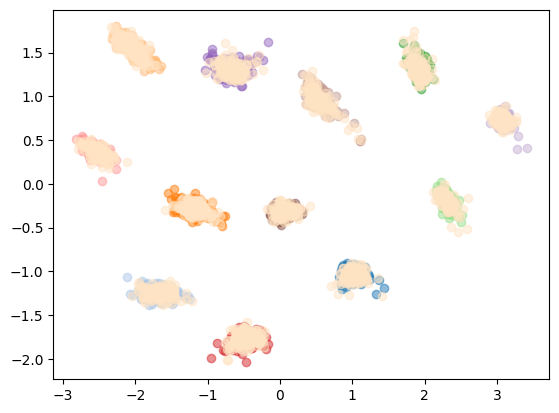

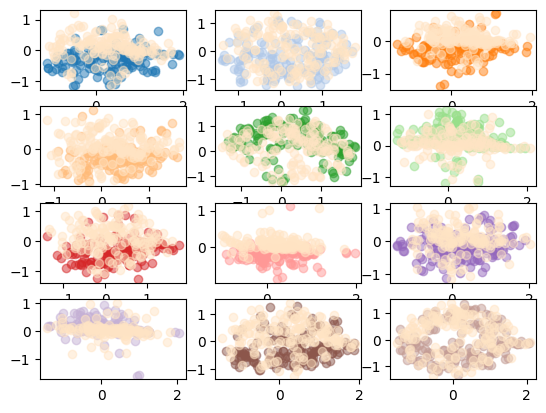

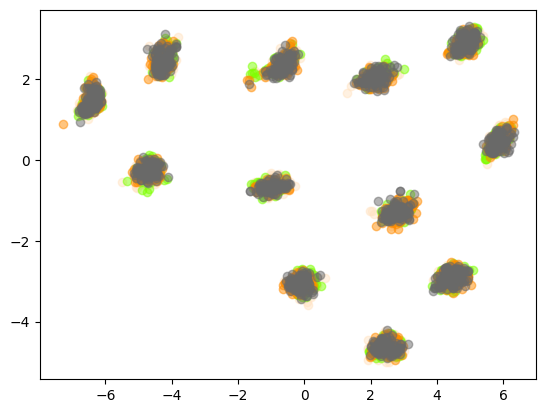

In [20]:
plt.figure(1)
for i in range(len(subjects)):
    # plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[i]
    c2 = list(colors.CSS4_COLORS)[6]
    plt.scatter(preclassif_nrc_riem[i*n_samples*2:(2*i+1)*n_samples,0], preclassif_nrc_riem[i*n_samples*2:(2*i+1)*n_samples,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c,alpha=0.5)
    plt.scatter(preclassif_nrc_riem[n_samples*(2*i+1):(i+1)*n_samples*2,0], preclassif_nrc_riem[n_samples*(2*i+1):(i+1)*n_samples*2,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c2,alpha=0.5)
# plt.legend()

plt.figure(2)
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[i]
    c2 = list(colors.CSS4_COLORS)[6]
    plt.scatter(preclassif_rc_riem[i*n_samples*2:(2*i+1)*n_samples,0], preclassif_rc_riem[i*n_samples*2:(2*i+1)*n_samples,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c,alpha=0.5)
    plt.scatter(preclassif_rc_riem[n_samples*(2*i+1):(i+1)*n_samples*2,0], preclassif_rc_riem[n_samples*(2*i+1):(i+1)*n_samples*2,1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c2,alpha=0.5)
# plt.legend()
    
plt.figure(3)
for i in range(len(subjects)):
    # plt.subplot(4,3,i+1)
    c1 = list(colors.CSS4_COLORS)[6]
    c2 = list(colors.CSS4_COLORS)[14]
    c3 = list(colors.CSS4_COLORS)[30]
    c4 = list(colors.CSS4_COLORS)[42]
    plt.scatter(preclassif_nrc_riem_code[i*n_samples_code*4:(4*i+1)*n_samples_code,0], preclassif_nrc_riem_code[i*n_samples_code*4:(4*i+1)*n_samples_code,1],label="sub{}_lab{}".format(i//4,(i+1)%4),c=c1,alpha=0.5)
    plt.scatter(preclassif_nrc_riem_code[n_samples_code*(4*i+1):(4*i+2)*n_samples_code,0], preclassif_nrc_riem_code[n_samples_code*(4*i+1):(4*i+2)*n_samples_code,1],label="sub{}_lab{}".format(i//4,(i+1)%4),c=c2,alpha=0.5)
    plt.scatter(preclassif_nrc_riem_code[n_samples_code*(4*i+2):(4*i+3)*n_samples_code,0], preclassif_nrc_riem_code[n_samples_code*(4*i+2):(4*i+3)*n_samples_code,1],label="sub{}_lab{}".format(i//4,(i+2)%4),c=c3,alpha=0.5)
    plt.scatter(preclassif_nrc_riem_code[n_samples_code*(4*i+3):(i+1)*n_samples_code*4,0], preclassif_nrc_riem_code[n_samples_code*(4*i+3):(i+1)*n_samples_code*4,1],label="sub{}_lab{}".format(i//4,(i+3)%4),c=c4,alpha=0.5)

# plt.legend()

plt.show()

## Plot with pre-modifications needed on the data

### Convex shape

In [22]:



def alpha_shape(points, alpha, only_outer=True):
    """
    Compute the alpha shape (concave hull) of a set of points.
    :param points: np.array of shape (n,2) points.
    :param alpha: alpha value.
    :param only_outer: boolean value to specify if we keep only the outer border
    or also inner edges.
    :return: set of (i,j) pairs representing edges of the alpha-shape. (i,j) are
    the indices in the points array.
    """
    assert points.shape[0] > 3, "Need at least four points"
    def add_edge(edges, i, j):
        """
        Add an edge between the i-th and j-th points,
        if not in the list already
        """
        if (i, j) in edges or (j, i) in edges:
            # already added
            assert (j, i) in edges, "Can't go twice over same directed edge right?"
            if only_outer:
                # if both neighboring triangles are in shape, it's not a boundary edge
                edges.remove((j, i))
            return
        edges.add((i, j))
    tri = Delaunay(points)
    edges = set()
    # Loop over triangles:
    # ia, ib, ic = indices of corner points of the triangle
    for ia, ib, ic in tri.vertices:
        pa = points[ia]
        pb = points[ib]
        pc = points[ic]
        # Computing radius of triangle circumcircle
        # www.mathalino.com/reviewer/derivation-of-formulas/derivation-of-formula-for-radius-of-circumcircle
        a = np.sqrt((pa[0] - pb[0]) ** 2 + (pa[1] - pb[1]) ** 2)
        b = np.sqrt((pb[0] - pc[0]) ** 2 + (pb[1] - pc[1]) ** 2)
        c = np.sqrt((pc[0] - pa[0]) ** 2 + (pc[1] - pa[1]) ** 2)
        s = (a + b + c) / 2.0
        area = np.sqrt(s * (s - a) * (s - b) * (s - c))
        circum_r = a * b * c / (4.0 * area)
        if circum_r < alpha:
            add_edge(edges, ia, ib)
            add_edge(edges, ib, ic)
            add_edge(edges, ic, ia)
    return edges


C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\40996892.py:4: DeprecationWarning: Delaunay attribute 'vertices' is deprecated in favour of 'simplices' and will be removed in Scipy 1.11.0.
  edges = alpha_shape(points, alpha=5, only_outer=True)
C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\40996892.py:18: DeprecationWarning: Delaunay attribute 'vertices' is deprecated in favour of 'simplices' and will be removed in Scipy 1.11.0.
  edges = alpha_shape(points, alpha=5, only_outer=True)


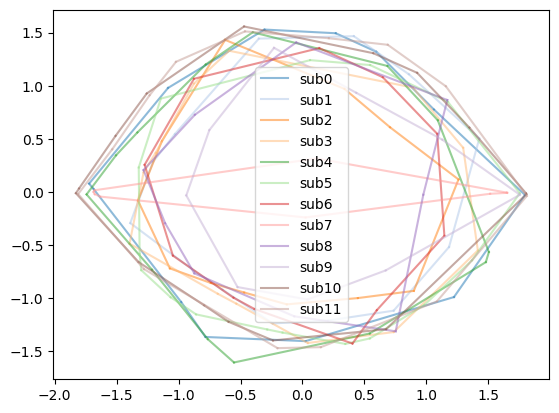

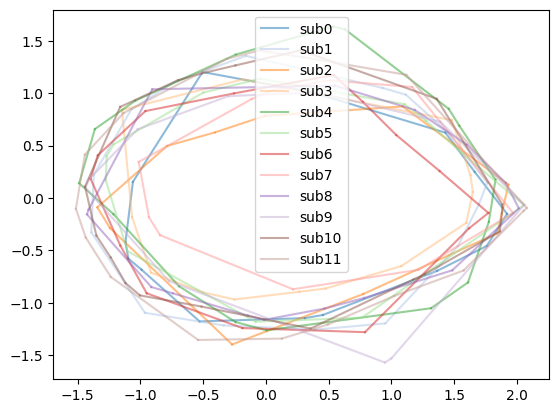

In [27]:
plt.figure(1)
for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    points = np.concatenate([preclassif_rc[i*n_samples*2:(i+1)*n_samples*2],preclassif_rc[i*n_samples*2:(i+1)*n_samples*2]])
    edges = alpha_shape(points, alpha=5, only_outer=True)
    write_legend = True
    for k, j in edges:
        if write_legend:
            plt.plot(points[[k, j], 0], points[[k, j], 1],c=c,label="sub{}".format(i),alpha=0.5)
            write_legend = False
        else:
            plt.plot(points[[k, j], 0], points[[k, j], 1],c=c,alpha=0.5)   
plt.legend()


plt.figure(2)
for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    points = np.concatenate([preclassif_rc_riem[i*n_samples*2:(i+1)*n_samples*2],preclassif_rc_riem[i*n_samples*2:(i+1)*n_samples*2]])
    edges = alpha_shape(points, alpha=5, only_outer=True)
    write_legend = True
    for k, j in edges:
        if write_legend:
            plt.plot(points[[k, j], 0], points[[k, j], 1],c=c,label="sub{}".format(i),alpha=0.5)
            write_legend = False
        else:
            plt.plot(points[[k, j], 0], points[[k, j], 1],c=c,alpha=0.5)
plt.legend()

C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\2584612750.py:4: DeprecationWarning: Delaunay attribute 'vertices' is deprecated in favour of 'simplices' and will be removed in Scipy 1.11.0.
  edges = alpha_shape(points, alpha=5, only_outer=True)
C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\2584612750.py:13: DeprecationWarning: Delaunay attribute 'vertices' is deprecated in favour of 'simplices' and will be removed in Scipy 1.11.0.
  edges = alpha_shape(points, alpha=10, only_outer=True)


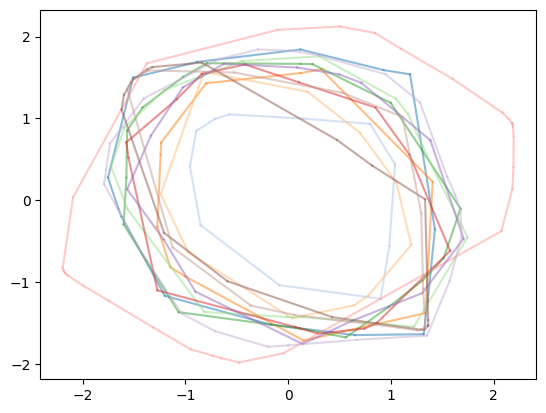

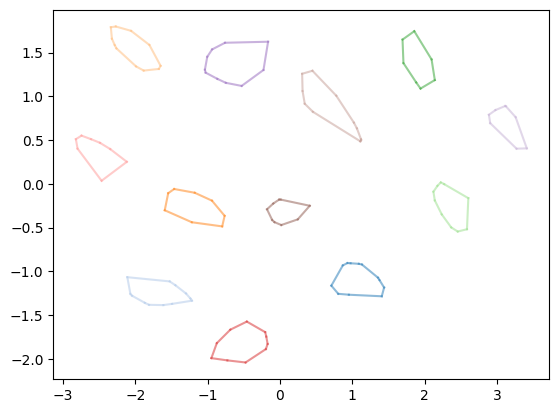

In [33]:
plt.figure(1)
for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    points = np.concatenate([preclassif_nrc[i*n_samples*2:(i+1)*n_samples*2],preclassif_nrc[i*n_samples*2:(i+1)*n_samples*2]])
    edges = alpha_shape(points, alpha=5, only_outer=True)

    for k, j in edges:
        plt.plot(points[[k, j], 0], points[[k, j], 1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c,alpha=0.5)


plt.figure(2)
for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    points = np.concatenate([preclassif_nrc_riem[i*n_samples*2:(i+1)*n_samples*2],preclassif_nrc_riem[i*n_samples*2:(i+1)*n_samples*2]])
    edges = alpha_shape(points, alpha=10, only_outer=True)

    for k, j in edges:
        plt.plot(points[[k, j], 0], points[[k, j], 1],label="sub{}_lab{}".format(i//2,(i+1)%2),c=c,alpha=0.5)


# plt.legend()

C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\679298421.py:4: DeprecationWarning: Delaunay attribute 'vertices' is deprecated in favour of 'simplices' and will be removed in Scipy 1.11.0.
  edges = alpha_shape(points, alpha=2, only_outer=True)
C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\679298421.py:10: DeprecationWarning: Delaunay attribute 'vertices' is deprecated in favour of 'simplices' and will be removed in Scipy 1.11.0.
  edges = alpha_shape(points, alpha=10, only_outer=True)
C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\679298421.py:20: DeprecationWarning: Delaunay attribute 'vertices' is deprecated in favour of 'simplices' and will be removed in Scipy 1.11.0.
  edges = alpha_shape(points, alpha=2, only_outer=True)
C:\Users\s.velut\AppData\Local\Temp\ipykernel_5848\679298421.py:26: DeprecationWarning: Delaunay attribute 'vertices' is deprecated in favour of 'simplices' and will be removed in Scipy 1.11.0.
  edges = alpha_shape(points, alpha=10, only_outer=True)

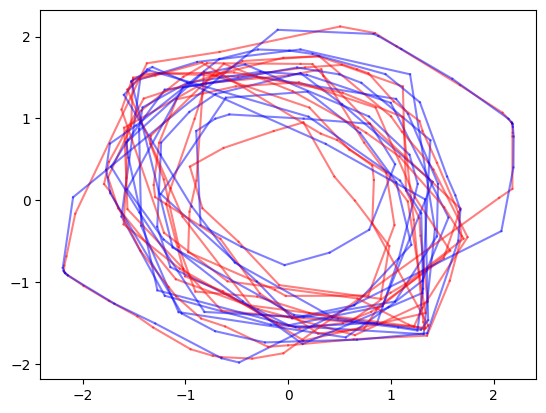

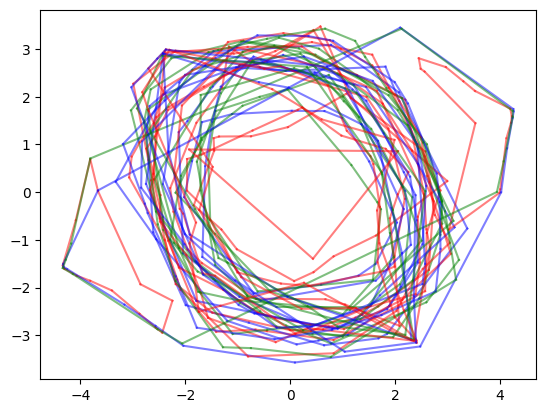

In [32]:
plt.figure(1)
for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    points = preclassif_nrc[i*n_samples*2:(2*i+1)*n_samples]
    edges = alpha_shape(points, alpha=2, only_outer=True)

    for k, j in edges:
        plt.plot(points[[k, j], 0], points[[k, j], 1],label="sub{}_lab{}".format(i//2,(i+1)%2),c='r',alpha=0.5)
    
    points = preclassif_nrc[(2*i+1)*n_samples:(i+1)*n_samples*2]
    edges = alpha_shape(points, alpha=10, only_outer=True)

    for k, j in edges:
        plt.plot(points[[k, j], 0], points[[k, j], 1],label="sub{}_lab{}".format(i//2,(i+1)%2),c='b',alpha=0.5)


plt.figure(2)

for i,c in zip(range(len(subjects)),sns.color_palette("tab20", 20)):
    points = preclassif_nrc_code[i*n_samples_code*4:(4*i+1)*n_samples_code]
    edges = alpha_shape(points, alpha=2, only_outer=True)

    for k, j in edges:
        plt.plot(points[[k, j], 0], points[[k, j], 1],label="sub{}_lab{}".format(i//2,(i+1)%2),c='r',alpha=0.5)
    
    points = preclassif_nrc_code[n_samples_code*(4*i+1):(4*i+2)*n_samples_code]
    edges = alpha_shape(points, alpha=10, only_outer=True)

    for k, j in edges:
        plt.plot(points[[k, j], 0], points[[k, j], 1],label="sub{}_lab{}".format(i//2,(i+1)%2),c='b',alpha=0.5)

    points = preclassif_nrc_code[n_samples_code*(4*i+2):(4*i+3)*n_samples_code]
    edges = alpha_shape(points, alpha=10, only_outer=True)

    for k, j in edges:
        plt.plot(points[[k, j], 0], points[[k, j], 1],label="sub{}_lab{}".format(i//2,(i+1)%2),c='g',alpha=0.5)

        

# plt.legend()   

# plt.legend()

### Visualisation of the Epochs

In [3]:
pip install PyWavelets


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
import moabb
from utils import prepare_data,get_BVEP_data,balance,get_y_pred
import mne
import time
import os
import pywt
from scipy import signal
import sys
from moabb.paradigms import CVEP
sys.path.insert(0,"C:\\Users\\s.velut\\Documents\\These\\moabb\\moabb\\datasets")
from castillos2023 import CasitllosCVEP100,CasitllosCVEP40,CasitllosBurstVEP100,CasitllosBurstVEP40


In [5]:
def annot_max(x,y, ax=None):
    xmax = x[np.argmax(np.abs(y))]
    ymax = y.max()
    ymin = y.min()
    ymax = ymin if np.abs(ymin)>ymax else ymax
    text= "x={:.1f}, y={:.3e}".format(xmax, ymax)
    if not ax:
        ax=plt.gca()
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    arrowprops=dict(arrowstyle="->",connectionstyle="angle,angleA=0,angleB=60")
    kw = dict(xycoords='data',textcoords="axes fraction",
              arrowprops=arrowprops, bbox=bbox_props, ha="right", va="top")
    ax.annotate(text, xy=(xmax, ymax), xytext=(0.94,0.96), **kw)

In [6]:
def get_epochs(subject,moabb_ds,to_keep=None):    
    dataset_moabb = moabb_ds
    paradigm = CVEP()
    print(paradigm.n_classes)

    raw = dataset_moabb.get_data(subjects=subject)

    raw_data = []
    keys = list(raw.keys())
    labels = []
    labels_code = []
    list_epochs = []
    print(subject)
    print(keys)

    for ind_i,i in enumerate(subject):
        i-=1
        temp = raw[keys[ind_i]]["0"]["0"]

        temp_raw = temp.copy()
        print(temp_raw.ch_names)
        trial_chan = temp_raw.pick_channels(["stim_trial"],verbose=False)
        data = trial_chan.get_data()[0]
        labels_code.append(np.array(list(filter(lambda num: num != 0, data)),dtype=int)-200)

        if to_keep is not None:
            temp = temp.drop_channels([ch for ch in temp.ch_names if ch not in to_keep])

        temp = temp.filter(l_freq=1, h_freq=25, method="fir", verbose=True)
        mne.set_eeg_reference(temp, 'average', copy=False, verbose=False)
        events = mne.find_events(temp,["stim_epoch"])
        list_epochs.append(mne.Epochs(temp,events,{"0":100,"1":101},picks=temp.ch_names[:-2],tmin=-0.01,tmax=0.25))
    
    return np.array(list_epochs)

In [7]:
subjects = [1,2,3,4,5,6,7,8,9,10,11,12]
# subjects = [1,2]

moabb_ds = CasitllosBurstVEP100()

# keep = ["O1", "O2", "Oz", "P7", "P3", "P4", "P8", "Pz","stim_trial","stim_epoch"]
keep=None

n_channels = 32
on_frame = True

recenter = True
if on_frame:
    freq = 60
else:
    freq = 500
raw_data,labels,codes,labels_codes = get_BVEP_data(subjects,on_frame,to_keep=keep,moabb_ds=moabb_ds)
X_parent,Y_parent,domains_parent = prepare_data(subjects,raw_data,labels,on_frame,False,recenter,codes=codes,normalise=False)

Choosing the first None classes from all possible events.


None
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad ep

C:\Users\s.velut\Documents\These\moabb\moabb\datasets\castillos2023.py:129: RuntimeWarning: Data file name in EEG.data (P13_burst100.fdt) is incorrect, the file name must have changed on disk, using the correct file name (P6_burst100.fdt).
  raw = mne.io.read_raw_eeglab(file_path_list[0], preload=True, verbose=False)


C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projec

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projec

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projec

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projec

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projec

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projec

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
Recentering the matrix
Recentering the matrix
Recentering the matrix
Recentering the matrix
Recentering the matrix
Recentering the matrix
Recentering the matrix
Recentering the matrix
Recentering the matrix
Recentering the matrix
Recentering the matrix
Recentering the matrix


### Evoked after Xdawn

C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)
C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: invalid value encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)


C:\Users\s.velut\AppData\Local\Temp\ipykernel_15728\3013191799.py:14: RuntimeWarning: divide by zero encountered in divide
  X = np.abs(X / X_std + 1e-8)


(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)
(7020, 32, 126)


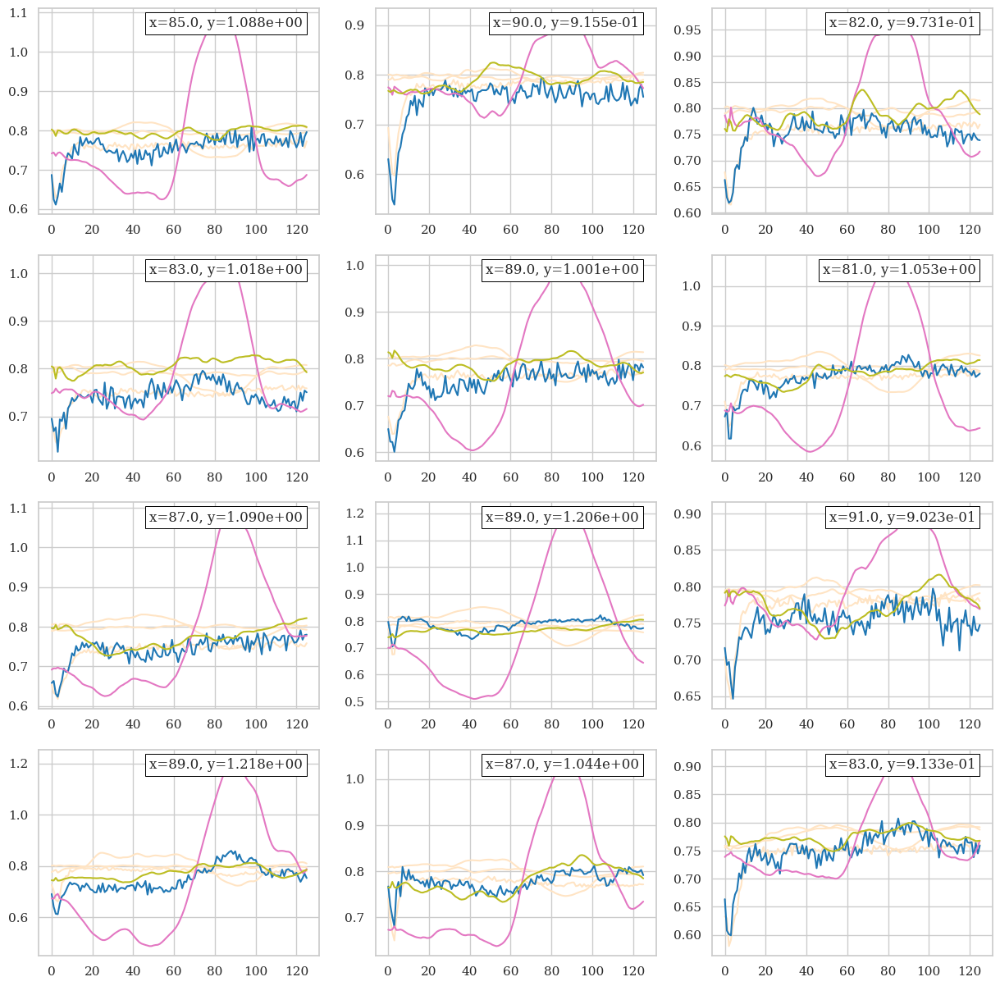

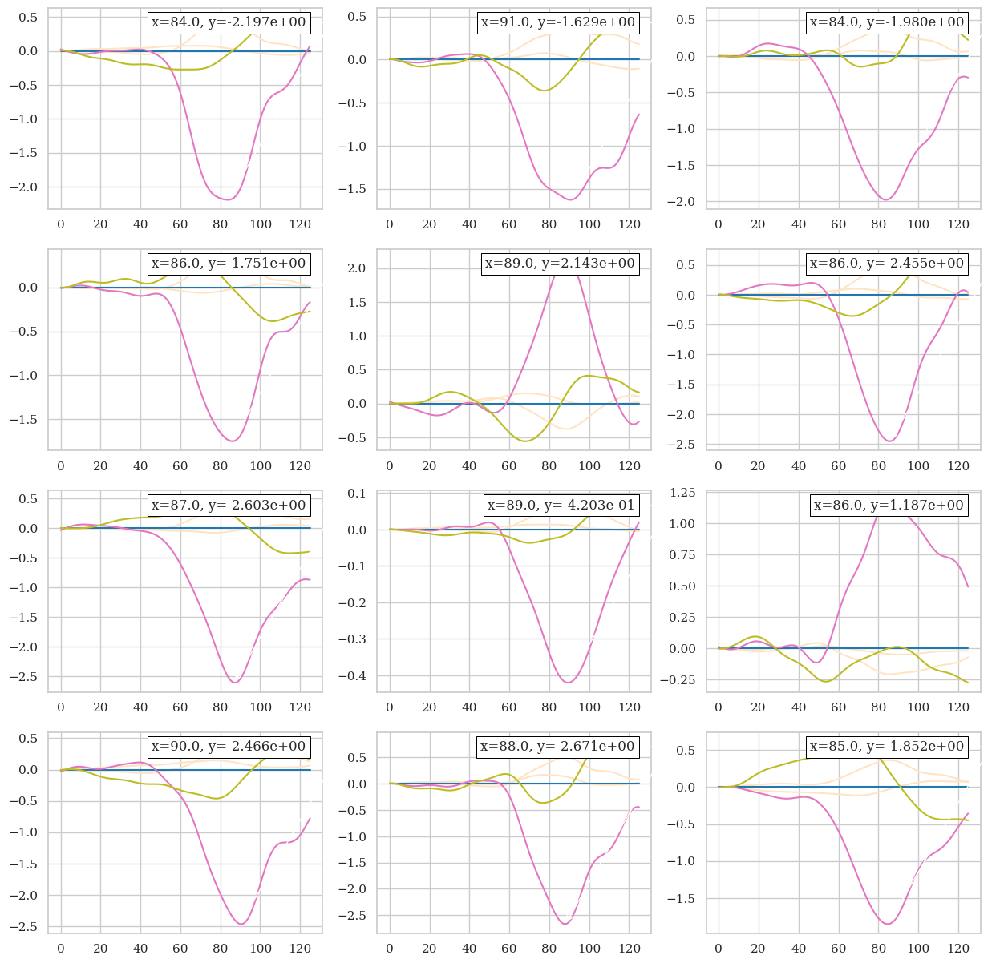

In [12]:
plt.figure(1,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)

    xdawn = Xdawn(estimator="lwf",nfilter=16,classes=[1])
    # xdawncov = XdawnCovariances(estimator='lwf',xdawn_estimator="lwf",nfilter=16,classes=[1],applyfilters=True)
    # xdawncov = xdawncov.fit(raw_data[i],labels[i])
    # xdawn = xdawncov.Xd_
    # X = xdawn.transform(raw_data[i])
    X = xdawn.fit(X_parent[i],Y_parent[i])
    X = xdawn.transform(X_parent[i])
    X = np.hstack([X,np.tile(xdawn.evokeds_[None,:,:],(raw_data[i].shape[0],1,1))])
    X_std = X.std(axis=0)
    X = np.abs(X / X_std + 1e-8)

    print(X.shape)


    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[0]
    c2 = list(colors.CSS4_COLORS)[6]
    channel = 0
    
    plt.plot(np.mean(X[labels[i]==0],axis=0)[channel],c=c2)
    plt.plot(np.mean(X[labels[i]==0],axis=0)[channel+1],c=list(colors.CSS4_COLORS)[6])
    plt.plot(np.mean(X[labels[i]==0],axis=0)[channel+2],c=list(colors.CSS4_COLORS)[6])
    plt.plot(np.mean(X[labels[i]==1],axis=0)[channel],c=c)
    plt.plot(np.mean(X[labels[i]==1],axis=0)[channel+1],c=sns.color_palette("tab20", 20)[12])
    plt.plot(np.mean(X[labels[i]==1],axis=0)[channel+2],c=sns.color_palette("tab20", 20)[16])
    annot_max(np.arange(0,300),np.mean(X[labels[i]==1],axis=0)[channel+1])

plt.figure(2,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)

    xdawn = Xdawn(estimator="lwf",nfilter=16,classes=[1])
    # xdawncov = XdawnCovariances(estimator='lwf',xdawn_estimator="lwf",nfilter=16,classes=[1],applyfilters=True)
    # xdawncov = xdawncov.fit(raw_data[i],labels[i])
    # xdawn = xdawncov.Xd_
    # X = xdawn.transform(raw_data[i])
    X = xdawn.fit(X_parent[i],Y_parent[i])
    X = xdawn.transform(X_parent[i])
    X = np.hstack([X,np.tile(xdawn.evokeds_[None,:,:],(raw_data[i].shape[0],1,1))])
    # X_std = X.std(axis=0)
    # X /= X_std + 1e-8

    print(X.shape)


    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[0]
    c2 = list(colors.CSS4_COLORS)[6]
    channel = 0
    
    plt.plot(np.mean(X[labels[i]==0],axis=0)[channel],c=c2)
    plt.plot(np.mean(X[labels[i]==0],axis=0)[channel+1],c=list(colors.CSS4_COLORS)[6])
    plt.plot(np.mean(X[labels[i]==0],axis=0)[channel+2],c=list(colors.CSS4_COLORS)[6])
    plt.plot(np.mean(X[labels[i]==1],axis=0)[channel],c=c)
    plt.plot(np.mean(X[labels[i]==1],axis=0)[channel+1],c=sns.color_palette("tab20", 20)[12])
    plt.plot(np.mean(X[labels[i]==1],axis=0)[channel+2],c=sns.color_palette("tab20", 20)[16])
    annot_max(np.arange(0,300),np.mean(X[labels[i]==1],axis=0)[channel+1])

### cov matrices

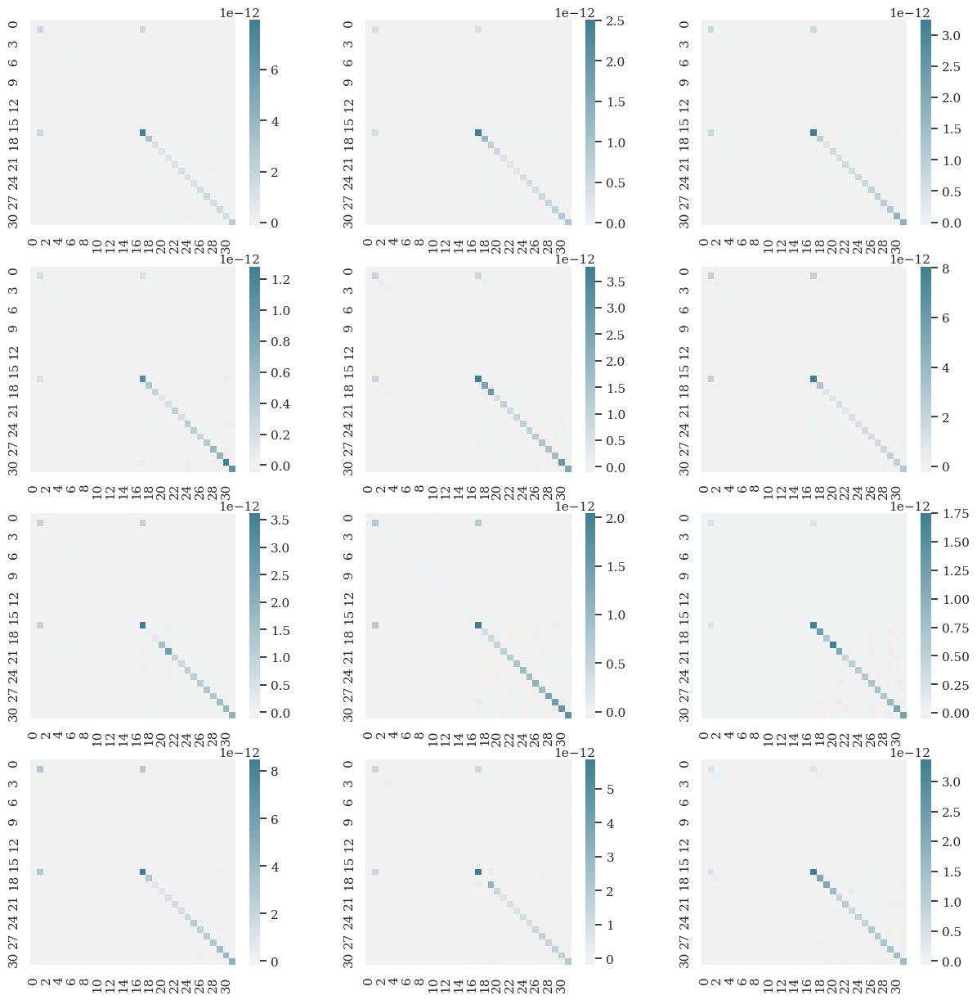

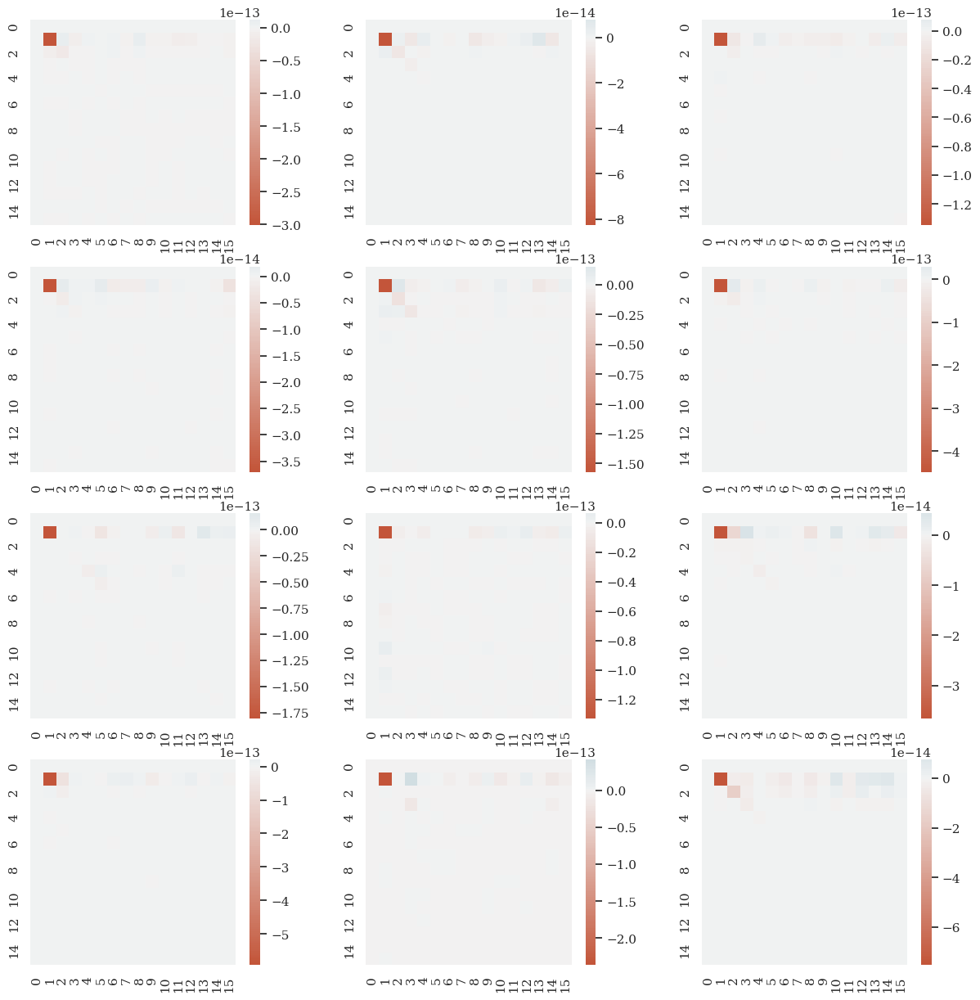

In [9]:
plt.figure(1,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)

    xdawncov = XdawnCovariances(estimator="lwf",xdawn_estimator="lwf",nfilter=16,classes=[1])
    X = xdawncov.fit_transform(X_parent[i],Y_parent[i])


    ax = sns.heatmap(
        np.mean(X[Y_parent[i]==1],axis=0), center=0, #vmin=-0.05,vmax=0.05,
        cmap=sns.diverging_palette(20, 220, n=200),
        square=True
    )

plt.figure(2,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)

    xdawncov = XdawnCovariances(estimator="lwf",xdawn_estimator="lwf",nfilter=16,classes=[1])
    X = xdawncov.fit_transform(X_parent[i],Y_parent[i])


    ax = sns.heatmap(
        np.mean(X[Y_parent[i]==0],axis=0)[:16,16:], center=0, #vmin=-0.05,vmax=0.05,
        cmap=sns.diverging_palette(20, 220, n=200),
        square=True
    )

### temporal recentering

In [ ]:
raw_data,labels,codes,labels_codes = get_BVEP_data(subjects,on_frame,to_keep=keep,moabb_ds=moabb_ds,window_size=0.4,start=-0.1)
tospd = False
# X_parent,Y_parent,domains_parent = prepare_data(subjects,raw_data,labels,on_frame,tospd,recenter,codes=codes,normalise=True)

NameError: name 'BaseCastillos2023' is not defined

In [ ]:
def get_peak_time(X,Y,channel=1):
    Xevoked = np.mean(X[Y==1],axis=0)[channel]
    ind_max = np.argmax(np.abs(Xevoked))
    t_max = ind_max * 1/500

    return t_max

In [ ]:
data_filtered = []
domains = []
evoked = []
for i in range(len(subjects)):
    print(raw_data[i].shape)

    xdawn = Xdawn(estimator="lwf",nfilter=16,classes=[1])
    X_filtered = xdawn.fit_transform(raw_data[i],labels[i])
    evoked.append(xdawn.evokeds_)
    # X_template = np.mean(X_filtered[labels[i]==1],axis=0)
    # print(X_filtered.shape)
    # data_filtered.append(npk.hstack([np.tile(X_template,(X_filtered.shape[0],1,1)),X_filtered]))
    data_filtered.append(X_filtered)

    domains.append(["Source_sub_{}".format(i),]*len(labels[i]))
data_filtered = np.array(data_filtered)
evoked = np.array(evoked)
print(data_filtered.shape)
domains = np.array(domains)

(7020, 32, 201)
(7020, 32, 201)
(7020, 32, 201)
(7020, 32, 201)
(7020, 32, 201)
(7020, 32, 201)
(7020, 32, 201)
(7020, 32, 201)
(7020, 32, 201)
(7020, 32, 201)
(7020, 32, 201)
(7020, 32, 201)
(12, 7020, 16, 201)


In [ ]:
def temp_recentering(X_train,X_test,Y_train,Y_test,evoked,domains_train,domain_test,start=-0.1):
    domains = np.unique(domains_train)
    t_max_list = [get_peak_time(X_train[domains_train==d],Y_train[domains_train==d]) for d in domains]

    t_mmax = np.mean(t_max_list)
    print(t_max_list)
    print(t_mmax)

    X_train_new = []
    evoked_new = []

    for i,d in enumerate(domains):
        ti = t_max_list[i]
        diff = ti-t_mmax
        ind_min = int((diff-start)*500)
        # print(ind_min)
        ind_max = int(0.25*500)
        X_temp = X_train[domains_train==d][:,:,ind_min:ind_min+ind_max]
        evoked_new.append(evoked[i][:,ind_min:ind_min+ind_max])
        X_std = X_temp.std(axis=0)
        # X_temp = Euc2SPD(X_temp,Y_train[domains_train==d])

        X_train_new.append(X_temp/(X_std + 1e-8))

        if domain_test==d:
            X_test_new = X_test[:,:,ind_min:ind_min+ind_max]/(X_std + 1e-8)


        # print(np.array(X_temp).shape)
    return np.concatenate(X_train_new),np.array(X_test_new),np.array(evoked_new)

In [ ]:
n_cal = 4
n_class = 4
nb_samples_cal = int(n_class*n_cal*(2.2-0.25)*60)
X_train_tr_list = []
X_test_tr_list = []
X_train_riem_tr_list = []
X_test_riem_tr_list = []
Y_train_list = []
Y_test_list = []
X_test_list = []


for i in range(len(subjects)):
    ind2take = [j for j in range(len(subjects)) if j!=i]

    X_train = np.concatenate([np.concatenate(data_filtered[ind2take]).reshape(-1,data_filtered.shape[-2],data_filtered.shape[-1]),
                              data_filtered[i][:nb_samples_cal]]).reshape(-1,data_filtered.shape[-2],data_filtered.shape[-1])
    Y_train = np.concatenate([np.concatenate(labels[ind2take]).reshape(-1),labels[i][:nb_samples_cal]]).reshape(-1)
    X_test = data_filtered[i][nb_samples_cal:]
    Y_test = labels[i][nb_samples_cal:]
    domains_train = np.concatenate([np.concatenate(domains[ind2take]).reshape(-1),domains[i][:nb_samples_cal]]).reshape(-1)
    domains_test = domains[i][nb_samples_cal:]

    X_test_list.append(X_test)

    X_train,X_test,evok = temp_recentering(X_train,X_test,Y_train,Y_test,evoked,domains_train,domains_test[0],start=-0.1)
    X_train_tr_list.append(X_train)
    X_test_tr_list.append(X_test)
    X_train_riem = np.zeros((X_train.shape[0],X_train.shape[1]*2,X_train.shape[1]*2))
    for d in np.unique(domains_train):
            X_train_riem[domains_train==d] = covariances_EP(X_train[domains_train==d],evok[i],estimator='lwf')
            if d==domains_test[0]:
                  X_test =covariances_EP(X_test,evok[i],estimator='lwf')
    X_train_riem_tr_list.append(X_train_riem)
    X_test_riem_tr_list.append(X_test)
    Y_train_list.append(Y_train)
    Y_test_list.append(Y_test)

    


    

[0.258, 0.27, 0.266, 0.256, 0.258, 0.262, 0.268, 0.262, 0.264, 0.268, 0.262, 0.27]
0.26366666666666666
[0.256, 0.27, 0.266, 0.256, 0.258, 0.262, 0.268, 0.262, 0.264, 0.268, 0.262, 0.27]
0.2635
[0.256, 0.27, 0.266, 0.256, 0.256, 0.262, 0.268, 0.262, 0.264, 0.268, 0.262, 0.27]
0.26333333333333336
[0.256, 0.27, 0.266, 0.256, 0.258, 0.262, 0.268, 0.262, 0.264, 0.268, 0.262, 0.27]
0.2635
[0.256, 0.27, 0.266, 0.256, 0.258, 0.262, 0.266, 0.262, 0.264, 0.268, 0.262, 0.27]
0.26333333333333336
[0.256, 0.27, 0.266, 0.256, 0.258, 0.262, 0.268, 0.262, 0.264, 0.268, 0.262, 0.27]
0.2635
[0.256, 0.27, 0.266, 0.256, 0.258, 0.262, 0.268, 0.262, 0.266, 0.268, 0.262, 0.27]
0.26366666666666666
[0.256, 0.27, 0.266, 0.256, 0.258, 0.262, 0.268, 0.262, 0.264, 0.266, 0.262, 0.27]
0.26333333333333336
[0.256, 0.27, 0.266, 0.256, 0.258, 0.262, 0.268, 0.262, 0.264, 0.268, 0.26, 0.27]
0.2633333333333333
[0.256, 0.27, 0.266, 0.256, 0.258, 0.262, 0.268, 0.262, 0.264, 0.268, 0.262, 0.272]
0.26366666666666666
[0.256, 0.

Not setting metadata
880 matching events found
No baseline correction applied
0 projection items activated
Axes(0.125,0.712609;0.227941x0.167391)
Not setting metadata
880 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
880 matching events found
No baseline correction applied
0 projection items activated
Axes(0.398529,0.712609;0.227941x0.167391)
Not setting metadata
880 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
880 matching events found
No baseline correction applied
0 projection items activated
Axes(0.672059,0.712609;0.227941x0.167391)
Not setting metadata
880 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
880 matching events found
No baseline correction applied
0 projection items activated
Axes(0.125,0.511739;0.227941x0.167391)
Not setting metadata
880 matching events found
No baseline correction applied
0 projectio

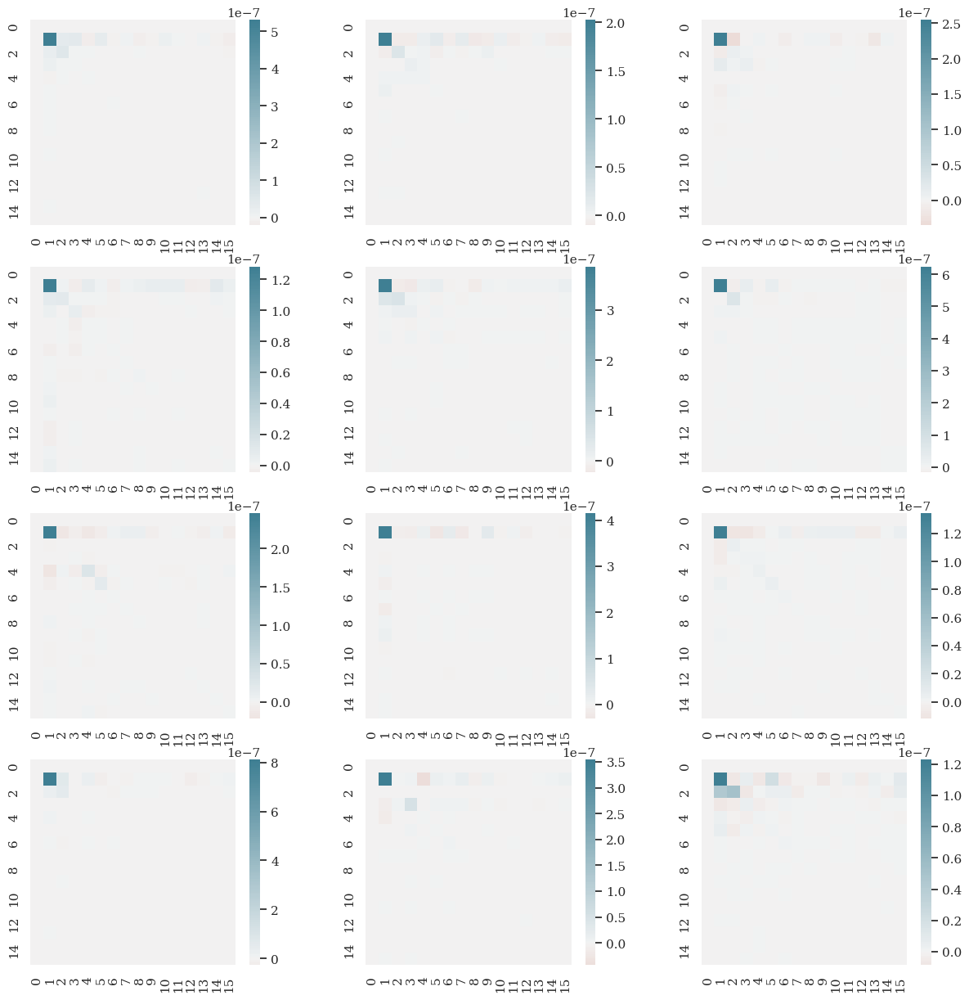

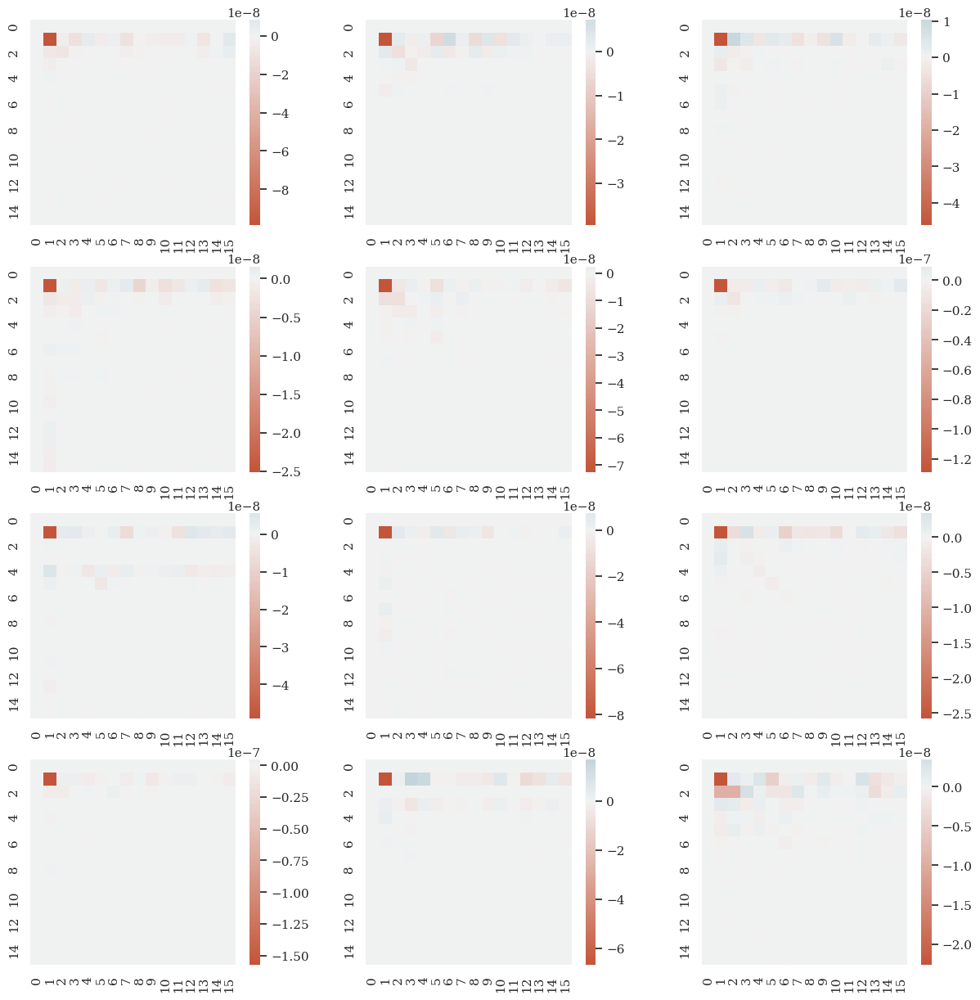

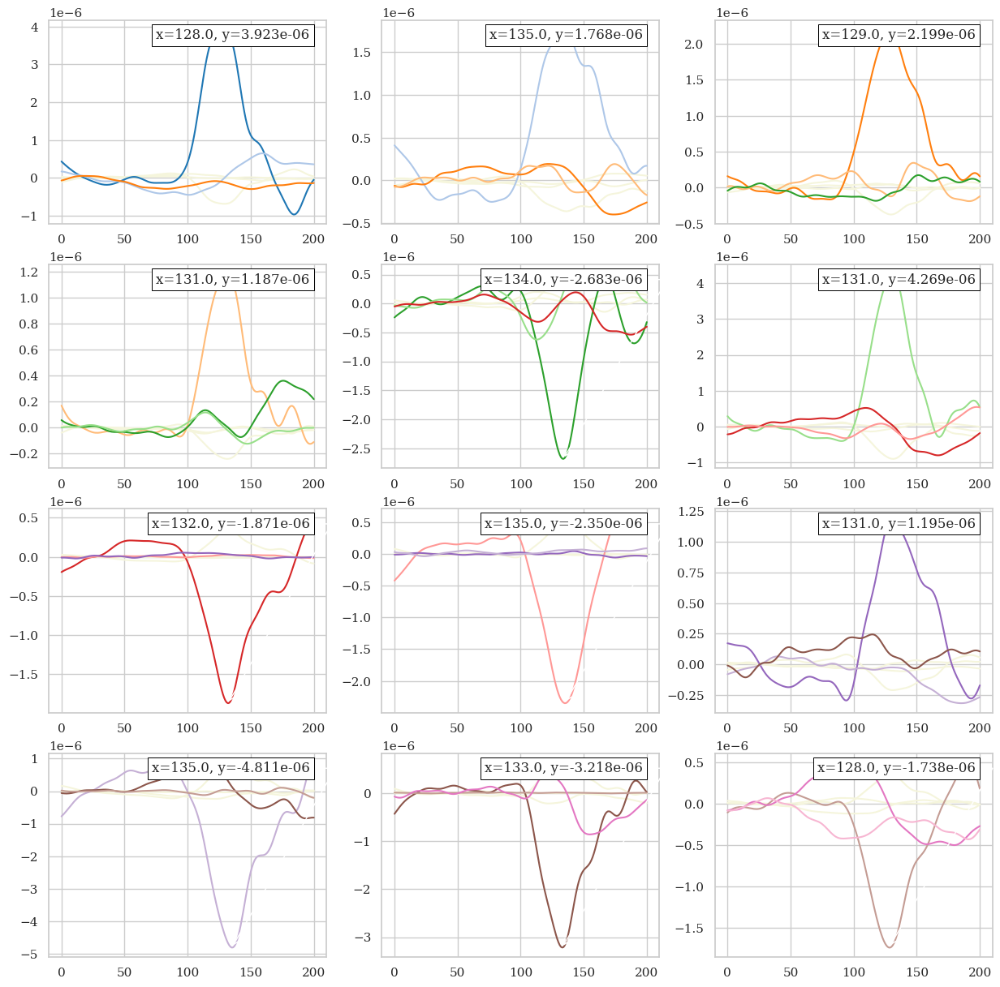

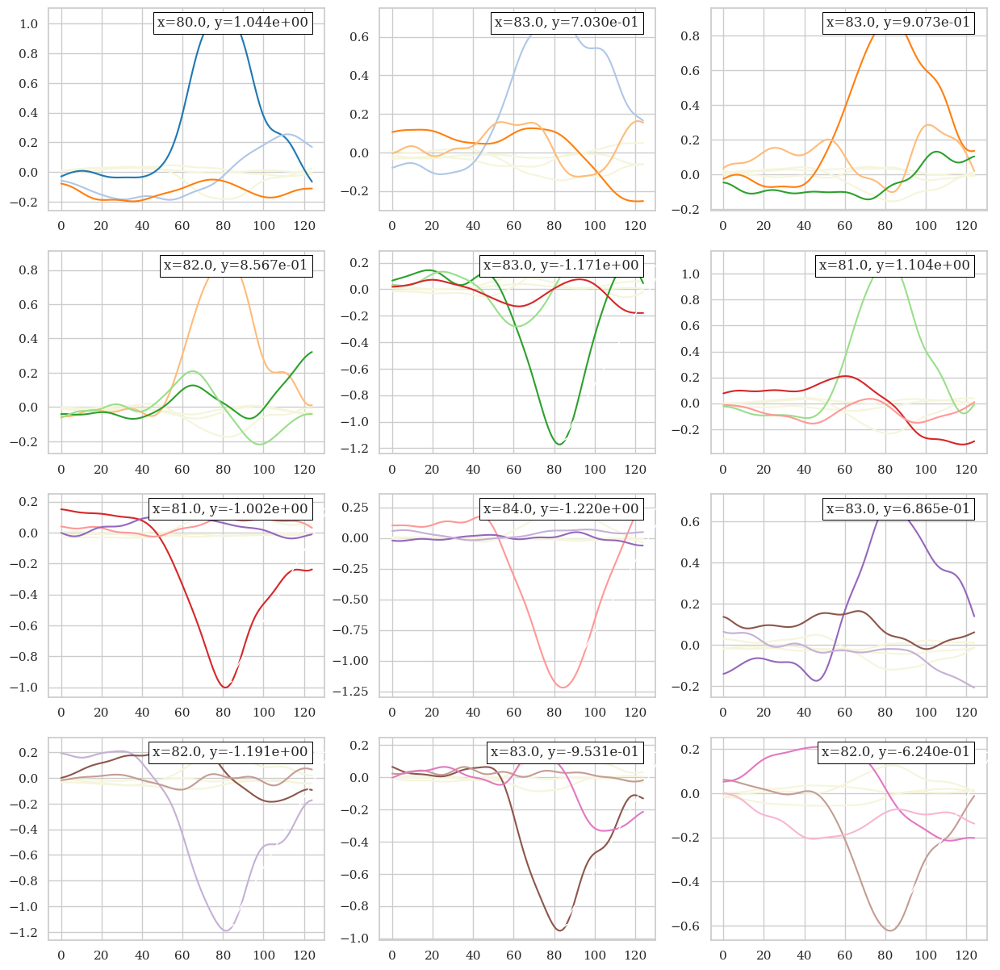

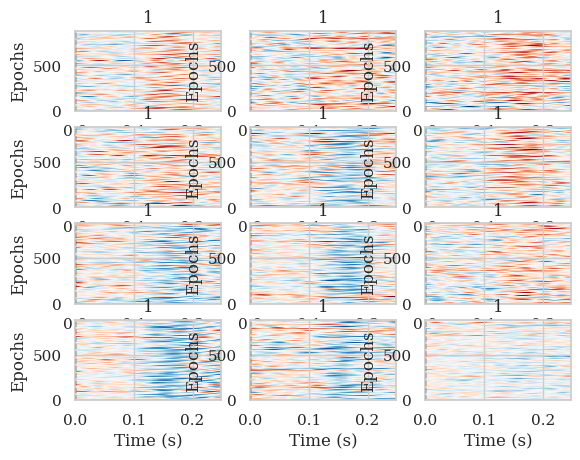

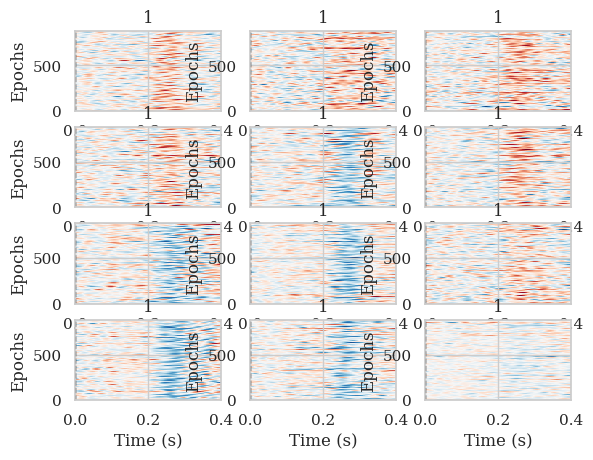

In [ ]:
for i in range(len(subjects)):
    plt.figure(1,figsize=(15,15))
    plt.subplot(4,3,i+1)
    ax = sns.heatmap(
        np.mean(X_test_riem_tr_list[i][Y_test_list[i]==1],axis=0)[:16,16:], center=0,
        cmap=sns.diverging_palette(20, 220, n=200),
        square=True
    )

    plt.figure(2,figsize=(15,15))
    plt.subplot(4,3,i+1)

    ax = sns.heatmap(
        np.mean(X_test_riem_tr_list[i][Y_test_list[i]==0],axis=0)[:16,16:], center=0,
        cmap=sns.diverging_palette(20, 220, n=200),
        square=True
    )

    plt.figure(3,figsize=(15,15))
    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[i]
    c2 = list(colors.CSS4_COLORS)[5]
    channel = 1
    plt.plot(np.mean(X_test_list[i][Y_test_list[i]==0],axis=0)[channel],c=c2)
    plt.plot(np.mean(X_test_list[i][Y_test_list[i]==0],axis=0)[channel+1],c=c2)
    plt.plot(np.mean(X_test_list[i][Y_test_list[i]==0],axis=0)[channel+2],c=c2)
    plt.plot(np.mean(X_test_list[i][Y_test_list[i]==1],axis=0)[channel],c=c)
    plt.plot(np.mean(X_test_list[i][Y_test_list[i]==1],axis=0)[channel+1],c=sns.color_palette("tab20", 20)[i+1])
    plt.plot(np.mean(X_test_list[i][Y_test_list[i]==1],axis=0)[channel+2],c=sns.color_palette("tab20", 20)[i+2])
    annot_max(np.arange(0,X_test_list[i].shape[-1]),np.mean(X_test_list[i][Y_test_list[i]==1],axis=0)[channel])

    plt.figure(4,figsize=(15,15))
    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[i]
    c2 = list(colors.CSS4_COLORS)[5]
    channel = 1
    plt.plot(np.mean(X_test_tr_list[i][Y_test_list[i]==0],axis=0)[channel],c=c2)
    plt.plot(np.mean(X_test_tr_list[i][Y_test_list[i]==0],axis=0)[channel+1],c=c2)
    plt.plot(np.mean(X_test_tr_list[i][Y_test_list[i]==0],axis=0)[channel+2],c=c2)
    plt.plot(np.mean(X_test_tr_list[i][Y_test_list[i]==1],axis=0)[channel],c=c)
    plt.plot(np.mean(X_test_tr_list[i][Y_test_list[i]==1],axis=0)[channel+1],c=sns.color_palette("tab20", 20)[i+1])
    plt.plot(np.mean(X_test_tr_list[i][Y_test_list[i]==1],axis=0)[channel+2],c=sns.color_palette("tab20", 20)[i+2])
    annot_max(np.arange(0,X_test_tr_list[i].shape[-1]),np.mean(X_test_tr_list[i][Y_test_list[i]==1],axis=0)[channel])

fig, ax = plt.subplots(4,3)
for i in range(len(subjects)):
    # plt.figure(5,figsize=(15,15))
    channel = 1
    e = mne.EpochsArray(X_test_tr_list[i][Y_test_list[i]==1],mne.create_info([str(i) for i in range(16)],500))
    print(ax[i//3,i%3])
    mne.viz.plot_epochs_image(e,channel,axes=ax[i//3,i%3],evoked=False,colorbar=False,show=False)

fig, ax = plt.subplots(4,3)
for i in range(len(subjects)):
    # plt.figure(5,figsize=(15,15))
    e = mne.EpochsArray(X_test_list[i][Y_test_list[i]==1],mne.create_info([str(i) for i in range(16)],500))
    print(ax[i//3,i%3])
    mne.viz.plot_epochs_image(e,channel,axes=ax[i//3,i%3],evoked=False,colorbar=False,show=False)


In [21]:
np.mean(X_test_tr_list[i][Y_test_list[i]==1],axis=0)[channel+1].shape[-1]

125

### plot image epochs

In [16]:
# keep = ["O1", "O2", "Oz","stim_trial","stim_epoch"]
epochs = get_epochs(subjects,moabb_ds,to_keep=keep)


Choosing the first None classes from all possible events.


None
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad ep

C:\Users\s.velut\Documents\These\moabb\moabb\datasets\castillos2023.py:129: RuntimeWarning: Data file name in EEG.data (P13_burst100.fdt) is incorrect, the file name must have changed on disk, using the correct file name (P6_burst100.fdt).
  raw = mne.io.read_raw_eeglab(file_path_list[0], preload=True, verbose=False)


C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs dropped
C:\Users\s.velut\mne_data\MNE-4class-vep-data\records\8255618\files\
Using data from preloaded Raw for 60 events and 1101 original time points ...
0 bad epochs 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Desi

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'stim_trial', 'stim_epoch']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 1651 samples (3.302 s)

7020 events found
Event IDs: [100 101]
Not setting metadata
7020 matching events found
Setting baseline interval to [-0.01, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Using data from preloaded Raw for 1200 events and 131 original time points ...


0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


C:\Users\s.velut\AppData\Local\Temp\ipykernel_17376\4228147346.py:3: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  mne.viz.plot_epochs_image(epochs[i]["1"],16,vmax=20,vmin=-20)


<Figure size 1500x1500 with 0 Axes>

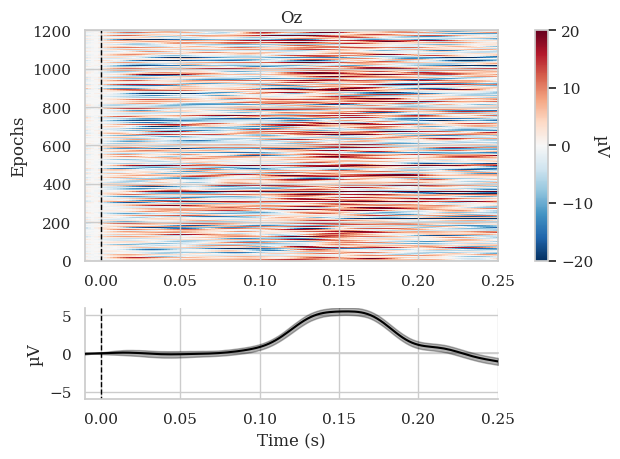

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


C:\Users\s.velut\AppData\Local\Temp\ipykernel_17376\4228147346.py:3: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  mne.viz.plot_epochs_image(epochs[i]["1"],16,vmax=20,vmin=-20)


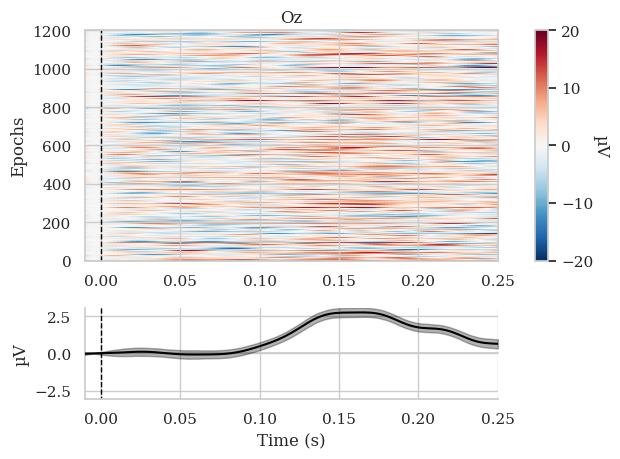

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


C:\Users\s.velut\AppData\Local\Temp\ipykernel_17376\4228147346.py:3: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  mne.viz.plot_epochs_image(epochs[i]["1"],16,vmax=20,vmin=-20)


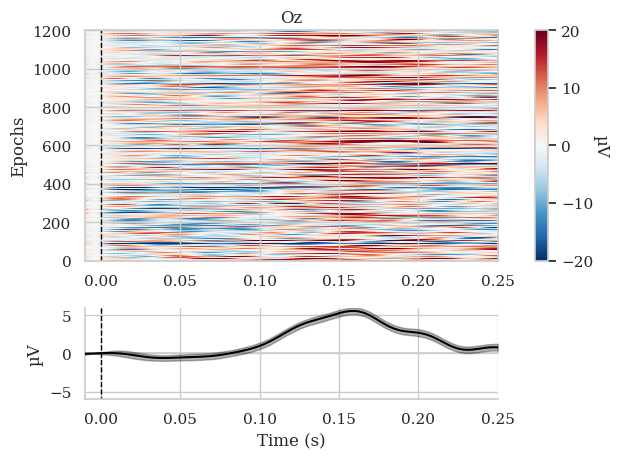

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


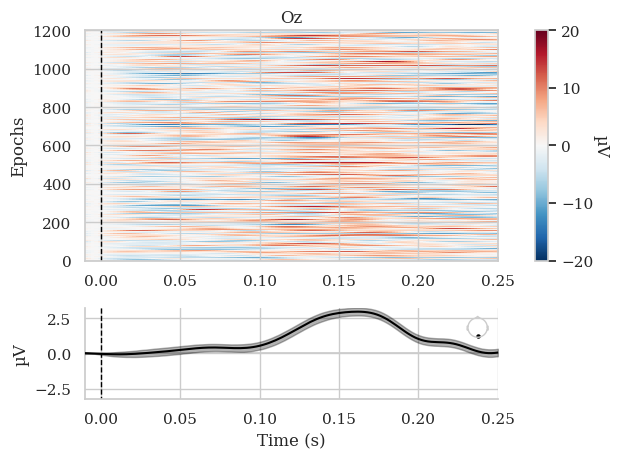

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


C:\Users\s.velut\AppData\Local\Temp\ipykernel_17376\4228147346.py:3: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  mne.viz.plot_epochs_image(epochs[i]["1"],16,vmax=20,vmin=-20)


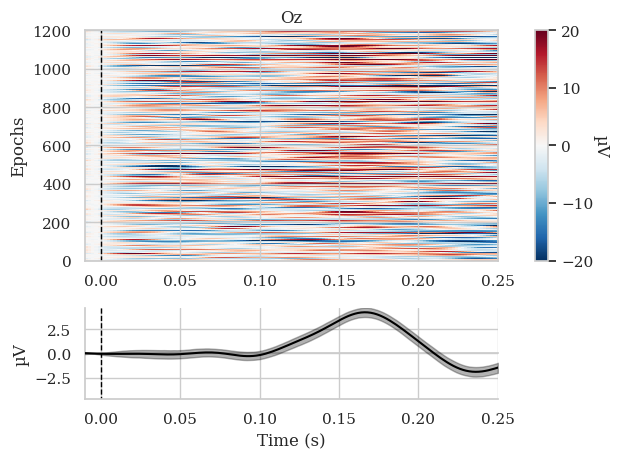

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


C:\Users\s.velut\AppData\Local\Temp\ipykernel_17376\4228147346.py:3: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  mne.viz.plot_epochs_image(epochs[i]["1"],16,vmax=20,vmin=-20)


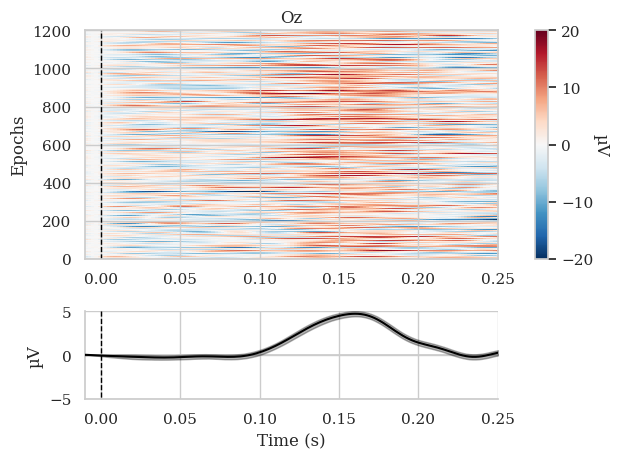

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


C:\Users\s.velut\AppData\Local\Temp\ipykernel_17376\4228147346.py:3: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  mne.viz.plot_epochs_image(epochs[i]["1"],16,vmax=20,vmin=-20)


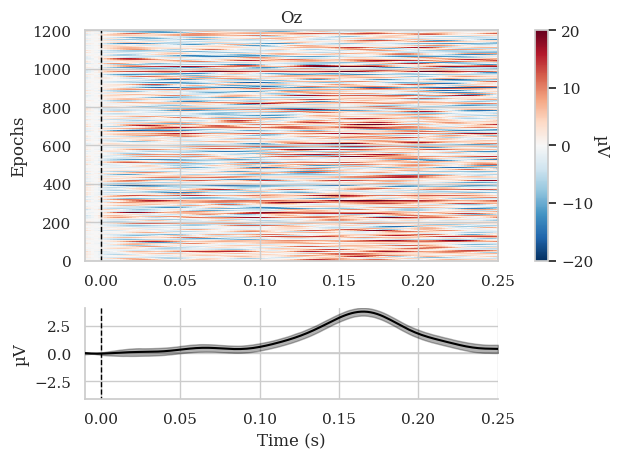

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


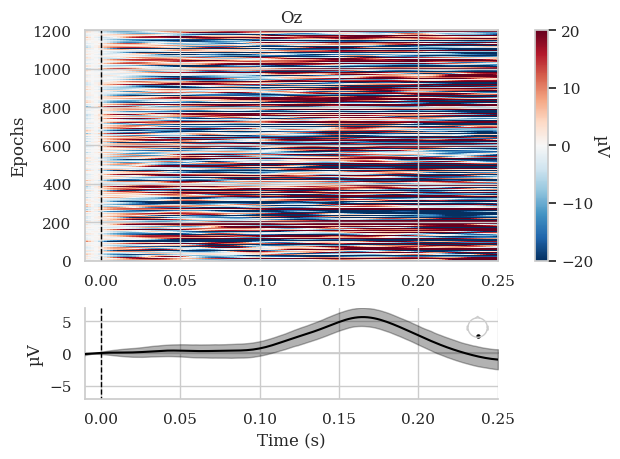

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


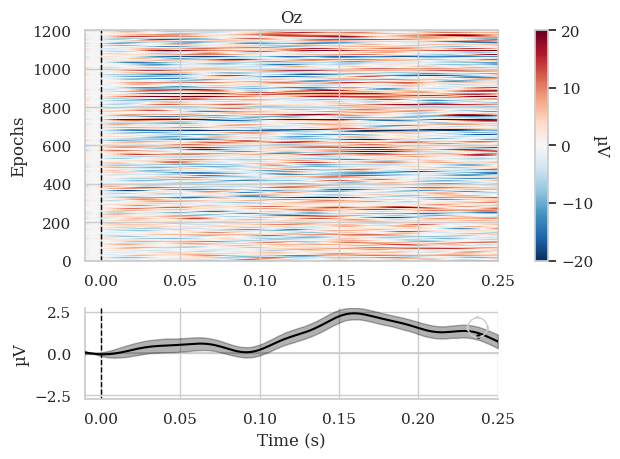

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


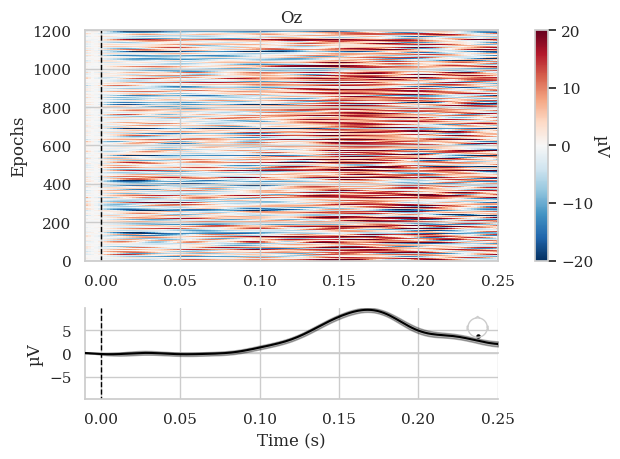

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


C:\Users\s.velut\AppData\Local\Temp\ipykernel_17376\4228147346.py:3: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  mne.viz.plot_epochs_image(epochs[i]["1"],16,vmax=20,vmin=-20)


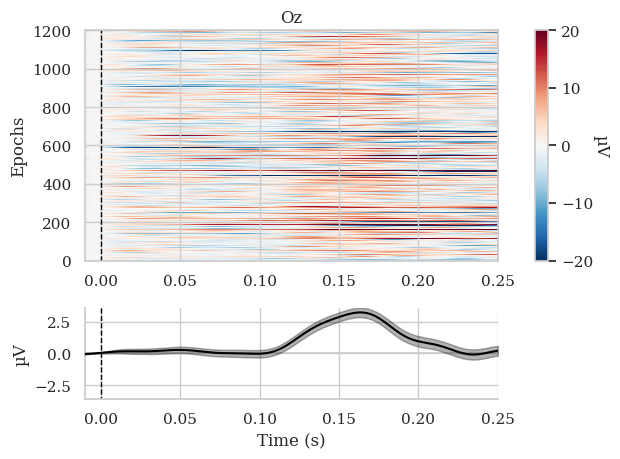

Using data from preloaded Raw for 1200 events and 131 original time points ...
0 bad epochs dropped
Not setting metadata
1200 matching events found
No baseline correction applied
0 projection items activated


C:\Users\s.velut\AppData\Local\Temp\ipykernel_17376\4228147346.py:3: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  mne.viz.plot_epochs_image(epochs[i]["1"],16,vmax=20,vmin=-20)


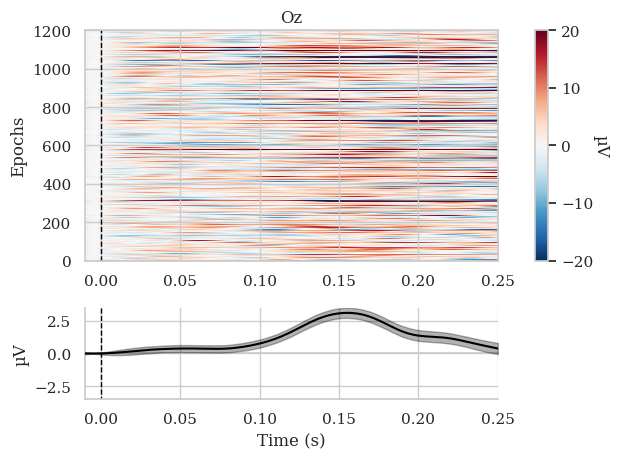

In [17]:
plt.figure(2,figsize=(15,15))
for i in range(len(subjects)):
    mne.viz.plot_epochs_image(epochs[i]["1"],16,vmax=20,vmin=-20)
    # plt.subplot(4,3,i+1)
    # plt.plot(np.mean(epochs[i]["1"].get_data(),axis=0))
plt.show()

### plot evoked

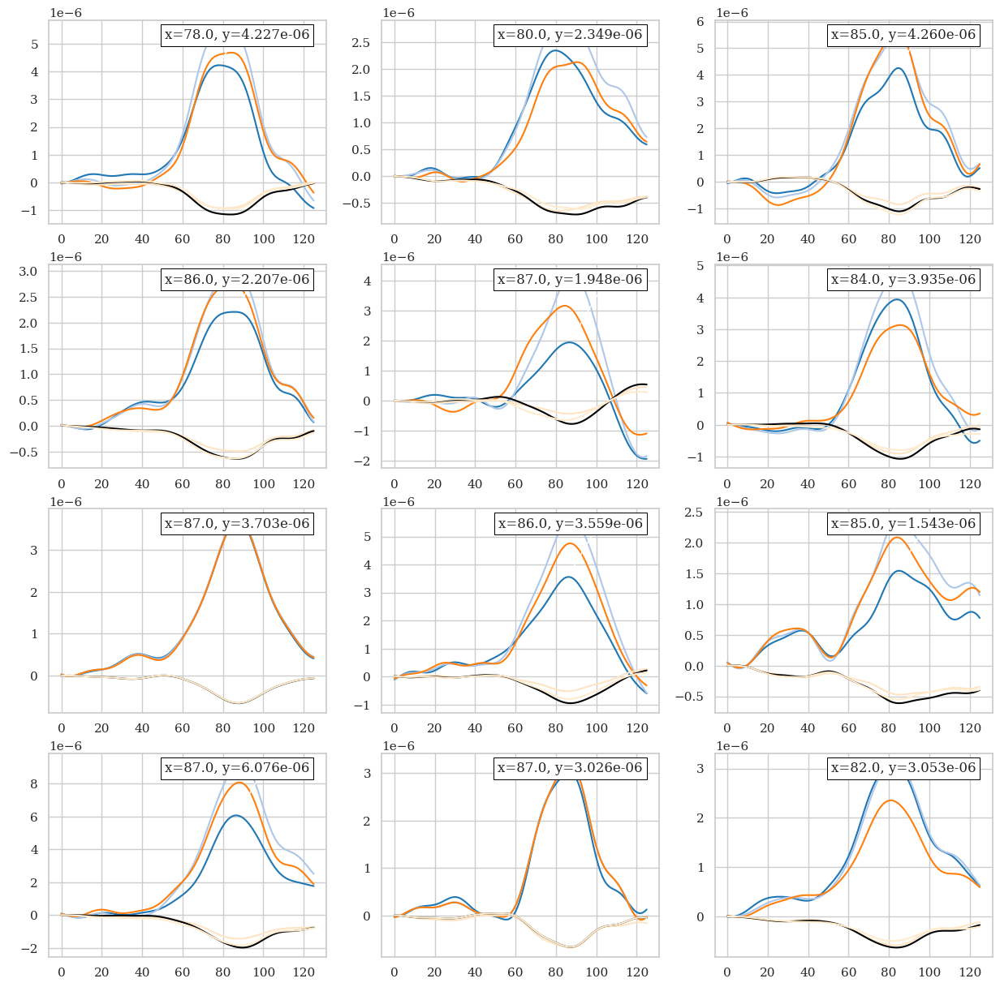

In [10]:
plt.figure(2,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[0]
    c2 = list(colors.CSS4_COLORS)[6]
    channel = 15
    plt.plot(np.mean(raw_data[i][labels[i]==1],axis=0)[channel],c=c)
    plt.plot(np.mean(raw_data[i][labels[i]==1],axis=0)[channel+1],c=sns.color_palette("tab20", 20)[1])
    plt.plot(np.mean(raw_data[i][labels[i]==1],axis=0)[channel+2],c=sns.color_palette("tab20", 20)[2])
    plt.plot(np.mean(raw_data[i][labels[i]==0],axis=0)[channel],c=c2)
    plt.plot(np.mean(raw_data[i][labels[i]==0],axis=0)[channel+1],c=list(colors.CSS4_COLORS)[7])
    plt.plot(np.mean(raw_data[i][labels[i]==0],axis=0)[channel+2],c=list(colors.CSS4_COLORS)[8])
    annot_max(np.arange(0,132),np.mean(raw_data[i][labels[i]==1],axis=0)[channel])
# plt.legend()

plt.show()

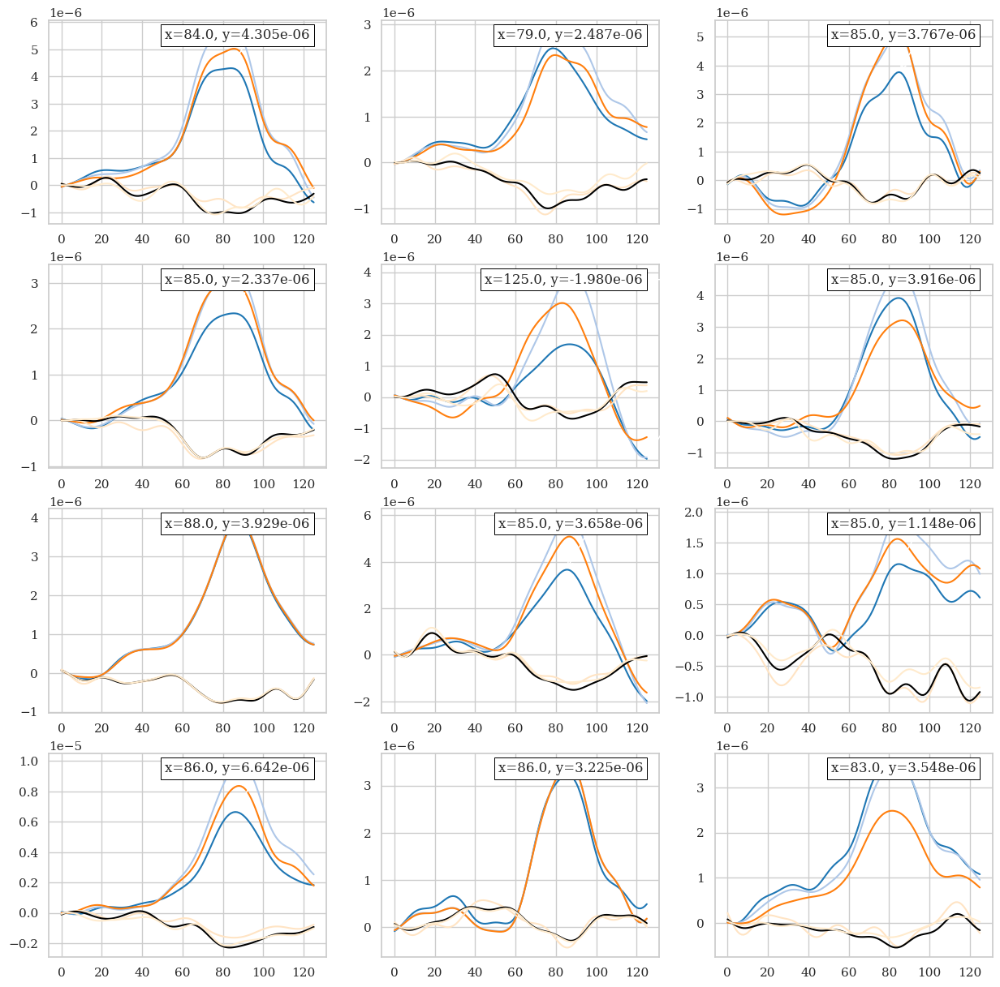

In [14]:
plt.figure(2,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[0]
    c2 = list(colors.CSS4_COLORS)[6]
    channel = 15

    nb_sample_cal = int(7*4*(2.2-0.25)*60)
    X = raw_data[i][:nb_sample_cal]
    y = labels[i][:nb_sample_cal]

    X, y,_ = balance(X,y,None)

    plt.plot(np.mean(X[y==1],axis=0)[channel],c=c)
    plt.plot(np.mean(X[y==1],axis=0)[channel+1],c=sns.color_palette("tab20", 20)[1])
    plt.plot(np.mean(X[y==1],axis=0)[channel+2],c=sns.color_palette("tab20", 20)[2])
    plt.plot(np.mean(X[y==0],axis=0)[channel],c=c2)
    plt.plot(np.mean(X[y==0],axis=0)[channel+1],c=list(colors.CSS4_COLORS)[7])
    plt.plot(np.mean(X[y==0],axis=0)[channel+2],c=list(colors.CSS4_COLORS)[8])
    annot_max(np.arange(0,132),np.mean(X[y==1],axis=0)[channel])
# plt.legend()

plt.show()

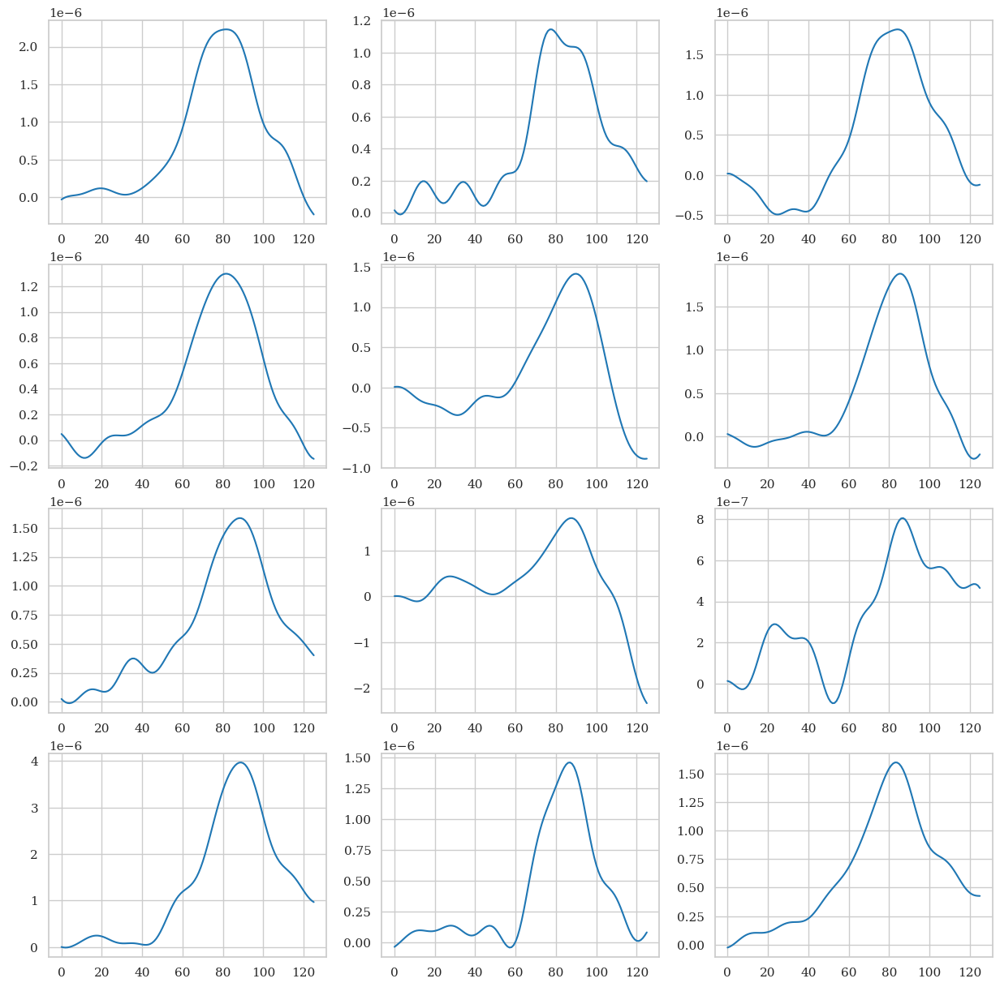

In [15]:
plt.figure(2,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[0]
    c2 = list(colors.CSS4_COLORS)[6]
    channel = 16

    nb_sample_cal = int(7*4*(2.2-0.25)*60)
    X = raw_data[i][:nb_sample_cal]
    y = labels[i][:nb_sample_cal]

    X, y,_ = balance(X,y,None)

    plt.plot(np.mean(X,axis=0)[channel],c=c)
    annot_max(np.arange(0,132),np.mean(X[y==1],axis=0)[channel])
# plt.legend()

plt.show()

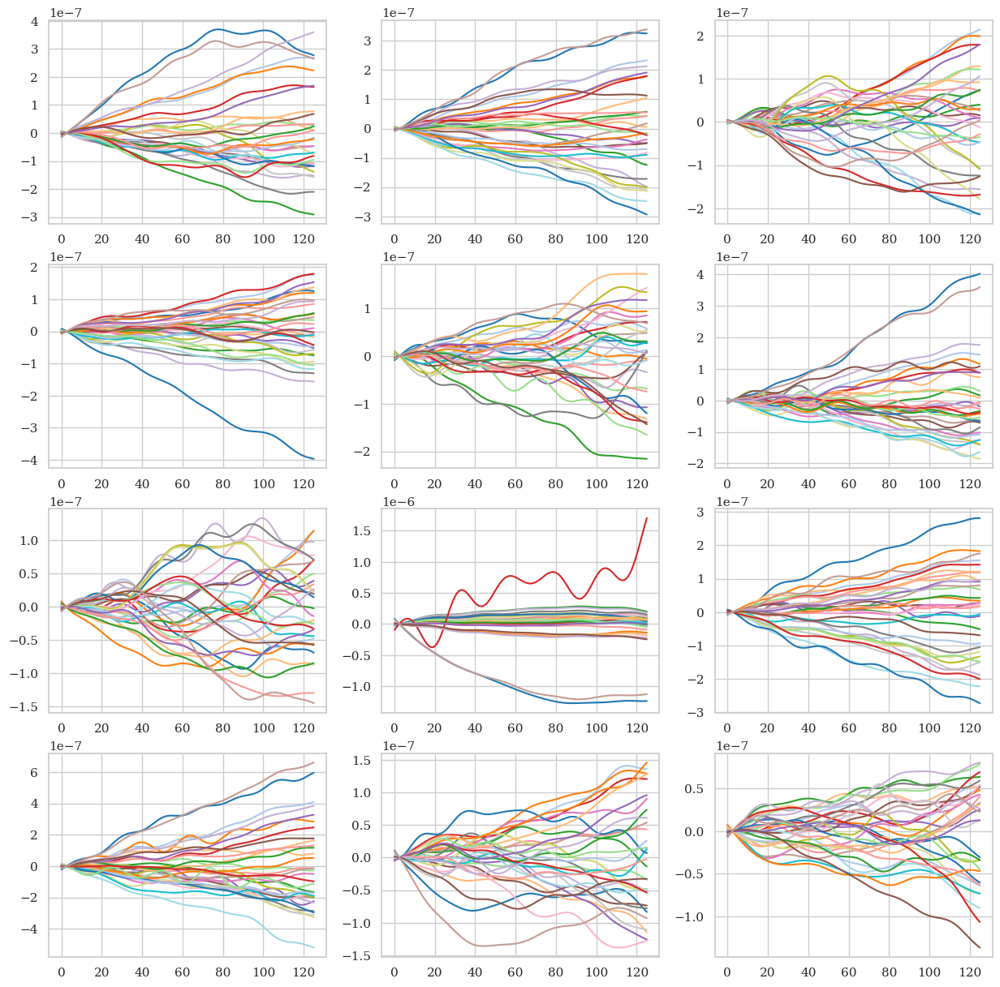

In [13]:
fig = plt.figure(2,figsize=(15,15))
labelling = [str(i) for i in range(32)]
for i in range(len(subjects)):
    ax = plt.subplot(4,3,i+1)
    for k in range(32):
        c = sns.color_palette("tab20", 32)[k]
        c2 = list(colors.CSS4_COLORS)[6]
        channel = k
        # plt.plot(np.mean(raw_data[i][labels[i]==1],axis=0)[channel],c=c,label=labelling[k])
        # plt.plot(np.mean(raw_data[i][labels[i]==0],axis=0)[channel],c=c2,label="ind0")
        plt.plot(np.mean(raw_data[i],axis=0)[channel],c=c)
    # annot_max(np.arange(0,132),np.mean(raw_data[i][labels[i]==1],axis=0)[channel])
h, l = ax.get_legend_handles_labels()
# fig.legend([h[2*j] for j in range(32)],[l[2*j] for j in range(32)],ncol = 8,bbox_to_anchor=(0.75,0.075),)

plt.show()

### FFT

c:\Users\s.velut\AppData\Local\Programs\Python\Python311\Lib\site-packages\matplotlib\cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
c:\Users\s.velut\AppData\Local\Programs\Python\Python311\Lib\site-packages\matplotlib\cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


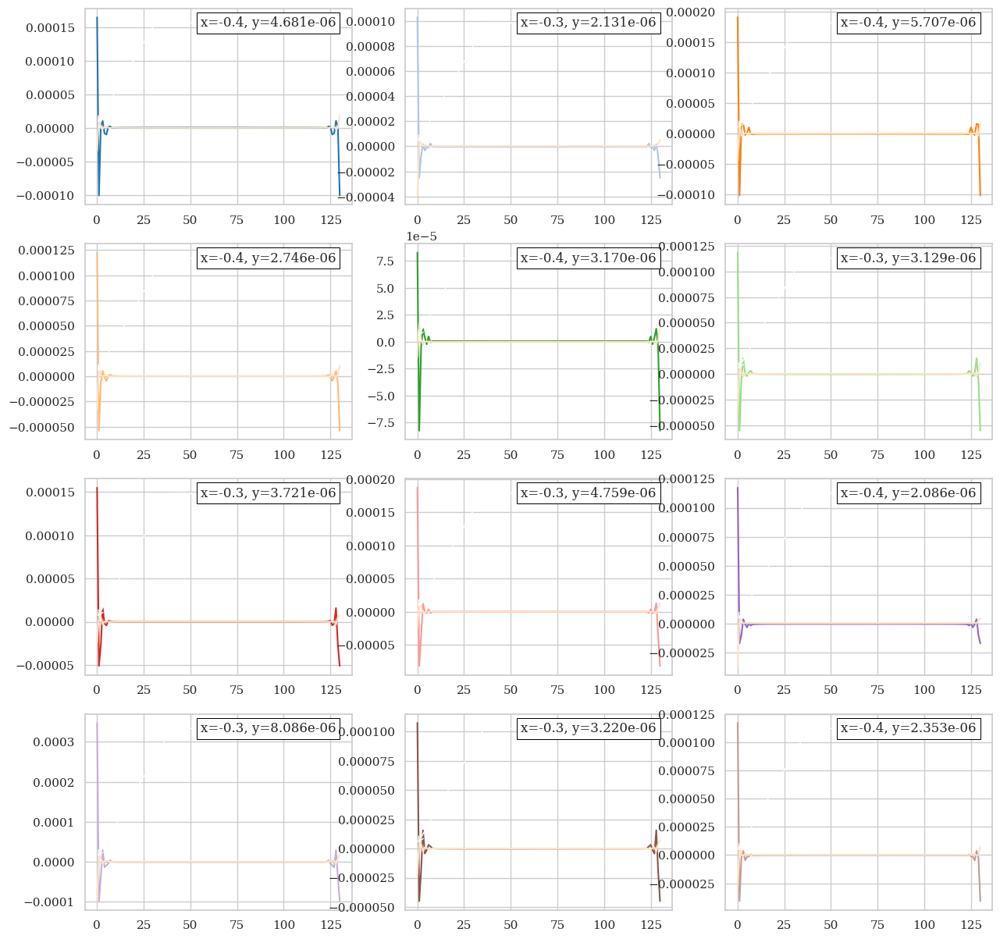

In [9]:
plt.figure(2,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    c = sns.color_palette("tab20", 20)[i]
    c2 = list(colors.CSS4_COLORS)[6]
    channel = 17
    freq = np.fft.fftfreq(raw_data[i].shape[-1], d=1)
    plt.plot(np.fft.fft(np.mean(raw_data[i][labels[i]==1],axis=0)[channel]),c=c)
    plt.plot(np.fft.fft((np.mean(raw_data[i][labels[i]==0],axis=0)[channel])),c=c2)
    annot_max(freq,np.mean(raw_data[i][labels[i]==1],axis=0)[channel])
# plt.legend()

plt.show()

### Wavelet

In [48]:
X = []
for i in range(len(subjects)):   
    xdawn = Xdawn(nfilter=16,classes=[1],estimator='lwf')
    xdawn = xdawn.fit(X_parent[i], labels[i])
    X_temp = xdawn.transform(X_parent[i])
    X.append(np.hstack([X_temp,np.tile(xdawn.evokeds_[None,:,:],(X_parent[i].shape[0],1,1))]))
X = np.array(X)

In [49]:
X.shape

(12, 7020, 32, 126)

label of frame i 0
(14, 25, 32, 126)
label of frame i 0
(14, 25, 32, 126)
label of frame i 0
(14, 25, 32, 126)
label of frame i 0
(14, 25, 32, 126)
label of frame i 0
(14, 25, 32, 126)
label of frame i 1
(14, 25, 32, 126)
label of frame i 1
(14, 25, 32, 126)
label of frame i 1
(14, 25, 32, 126)
label of frame i 1
(14, 25, 32, 126)
label of frame i 0
(14, 25, 32, 126)
label of frame i 0
(14, 25, 32, 126)
label of frame i 0
(14, 25, 32, 126)


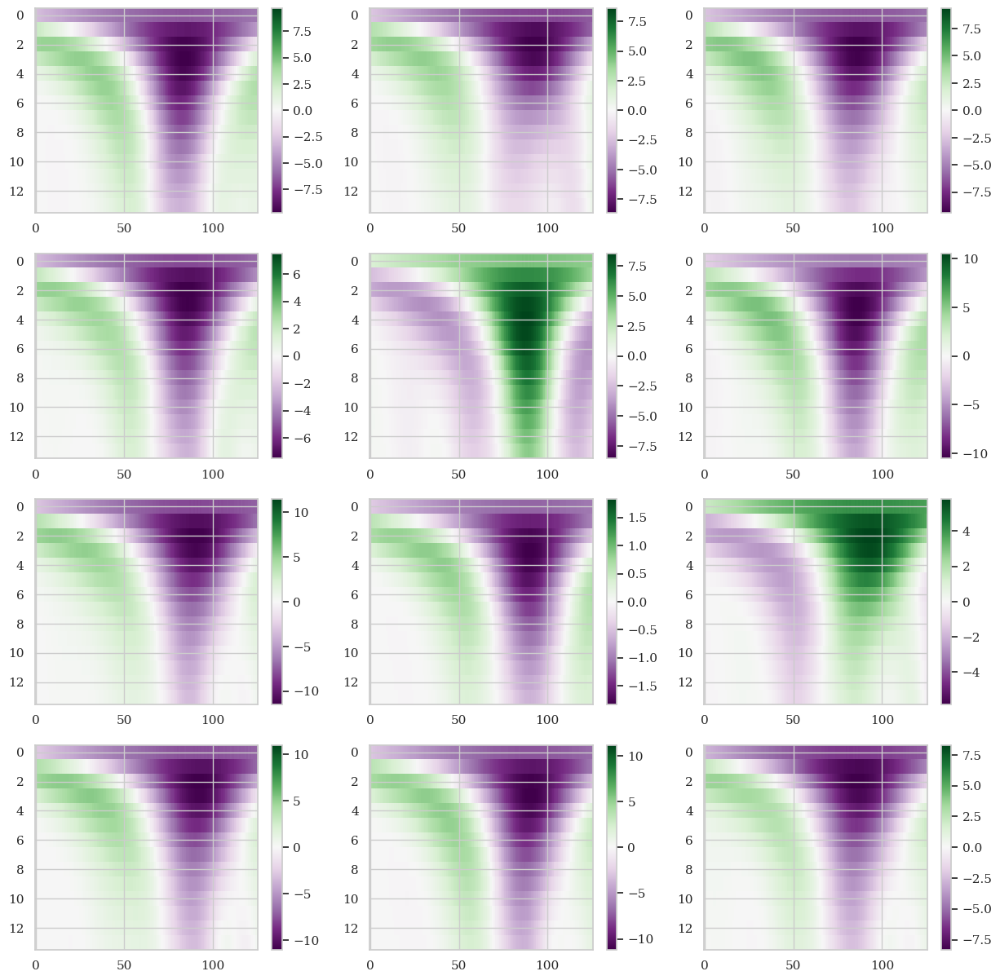

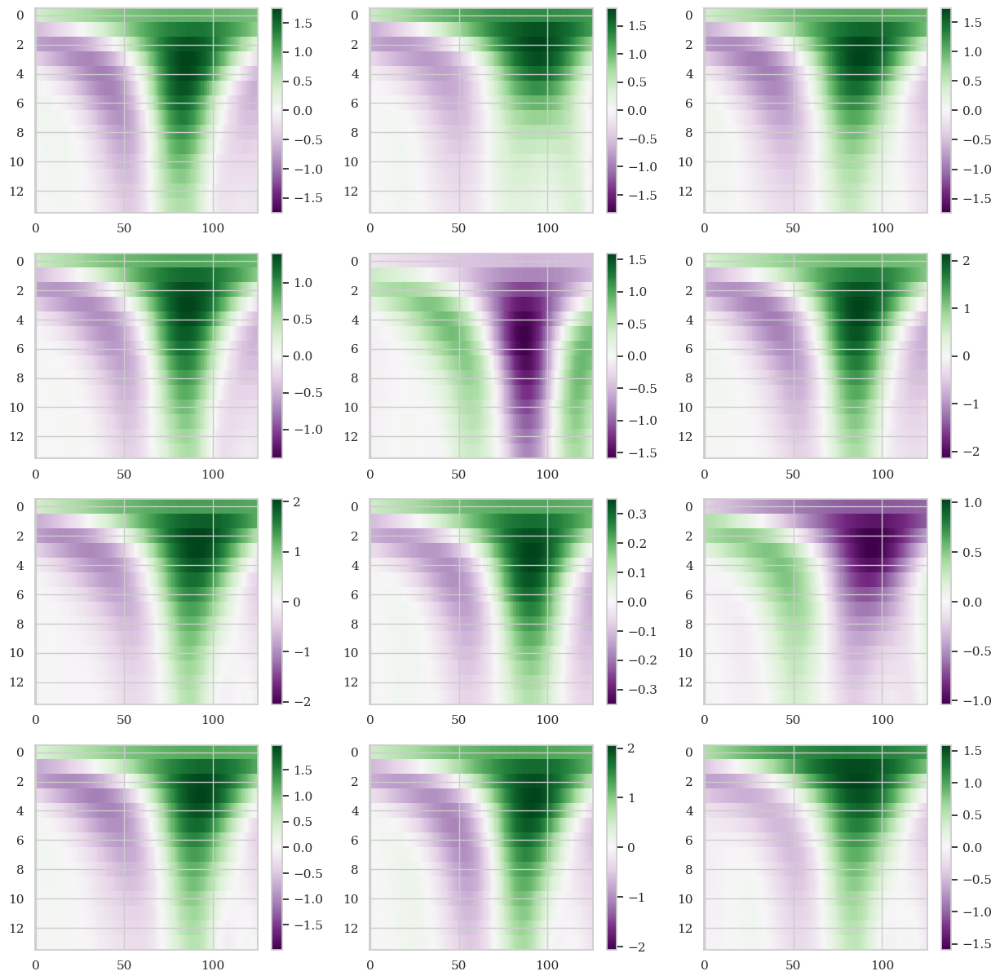

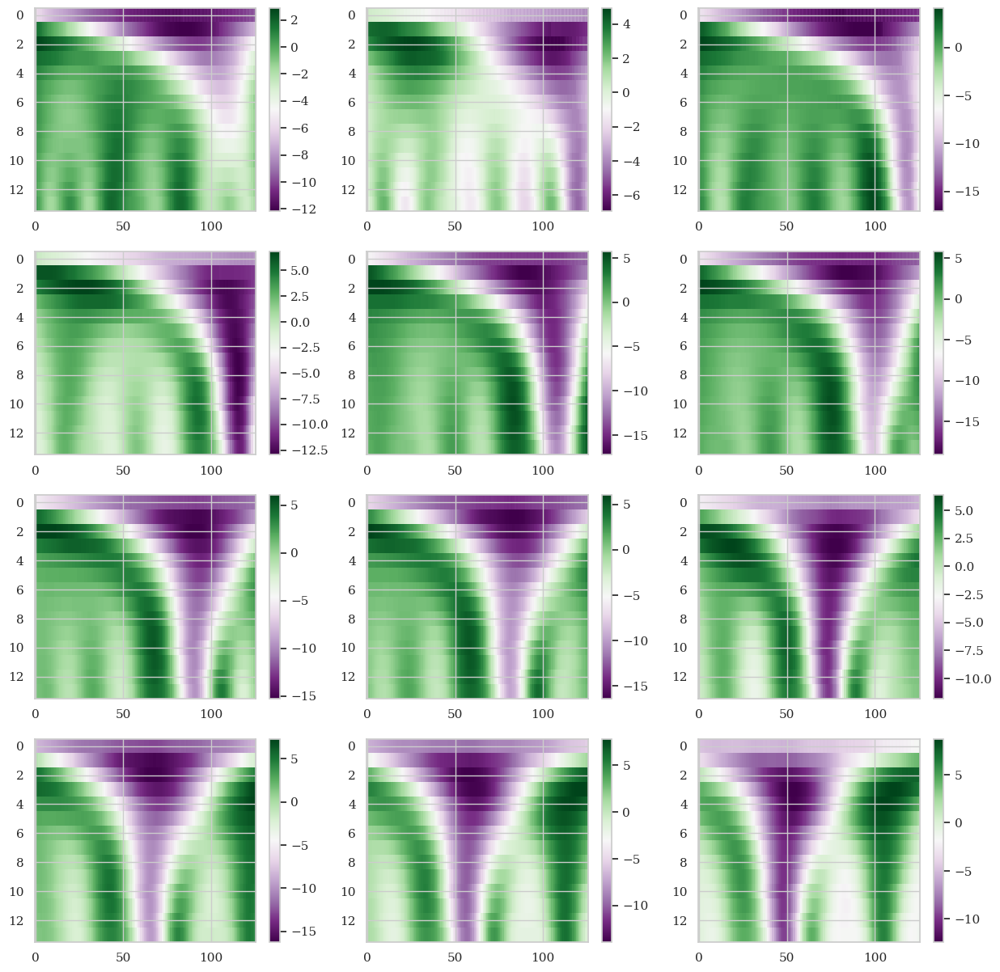

In [51]:
channel = 1
frequencies = np.arange(1,15)/500
scales = pywt.frequency2scale('mexh', frequencies)
vmin = -5e-05
vmax = 5e-05

plt.figure(1,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    cwtmatr,freq = pywt.cwt(np.mean(X[i][labels[i]==1],axis=0)[channel], scales, "mexh",1/500)
    # cwtmatr_yflip = np.flipud(cwtmatr)
    plt.imshow(cwtmatr, cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max(), interpolation='nearest')
    plt.colorbar()

plt.figure(2,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    cwtmatr,freq = pywt.cwt(np.mean(X[i][labels[i]==0],axis=0)[channel], scales, "mexh",1/500)
    # cwtmatr_yflip = np.flipud(cwtmatr)
    plt.imshow(cwtmatr, cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max(), interpolation='nearest')
    plt.colorbar()

plt.figure(3,figsize=(15,15))
for i in range(len(subjects)):
    plt.subplot(4,3,i+1)
    print("label of frame i",labels[0][i+25])
    cwtmatr,freq = pywt.cwt(X[0][i:i+25], scales, "mexh",1/500)
    print(cwtmatr.shape)
    # cwtmatr_yflip = np.flipud(cwtmatr)
    plt.imshow(cwtmatr[:,-1,channel,:], cmap='PRGn', aspect='auto', interpolation='nearest')
        #    vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
    plt.colorbar()

plt.show()

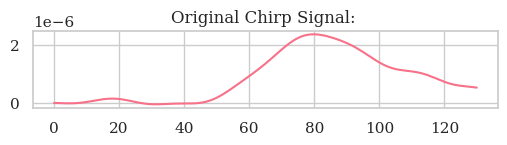

c:\Users\s.velut\AppData\Local\Programs\Python\Python311\Lib\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 2 is too high: all coefficients will experience boundary effects.
  warnings.warn(
c:\Users\s.velut\AppData\Local\Programs\Python\Python311\Lib\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 2 is too high: all coefficients will experience boundary effects.
  warnings.warn(
c:\Users\s.velut\AppData\Local\Programs\Python\Python311\Lib\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 2 is too high: all coefficients will experience boundary effects.
  warnings.warn(


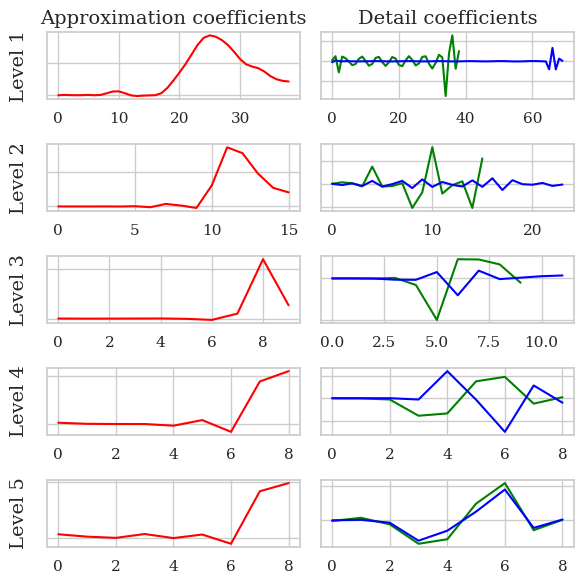

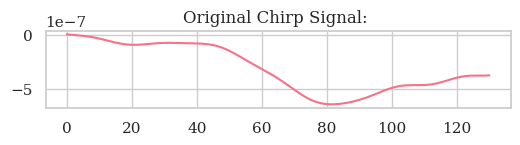

c:\Users\s.velut\AppData\Local\Programs\Python\Python311\Lib\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 2 is too high: all coefficients will experience boundary effects.
  warnings.warn(
c:\Users\s.velut\AppData\Local\Programs\Python\Python311\Lib\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 2 is too high: all coefficients will experience boundary effects.
  warnings.warn(
c:\Users\s.velut\AppData\Local\Programs\Python\Python311\Lib\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 2 is too high: all coefficients will experience boundary effects.
  warnings.warn(
c:\Users\s.velut\AppData\Local\Programs\Python\Python311\Lib\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 2 is too high: all coefficients will experience boundary effects.
  warnings.warn(


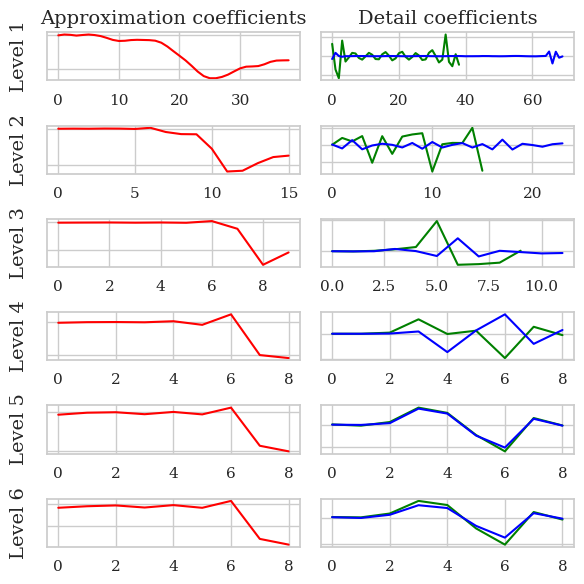

In [16]:
channel = 15
parti = 1
fig, ax = plt.subplots(figsize=(6,1))
ax.set_title("Original Chirp Signal: ")
ax.plot(np.mean(raw_data[parti][labels[parti]==1],axis=0)[channel])
plt.show()
        
data = np.mean(raw_data[parti][labels[parti]==1],axis=0)[channel]
waveletname = 'db5'

fig, axarr = plt.subplots(nrows=5, ncols=2, figsize=(6,6))
for ii in range(5):
    (data, coeff_d,coeffd2) = pywt.wavedec(data, waveletname,level=2)
    axarr[ii, 0].plot(data, 'r')
    axarr[ii, 1].plot(coeff_d, 'g')
    axarr[ii, 1].plot(coeffd2, 'b')
    axarr[ii, 0].set_ylabel("Level {}".format(ii + 1), fontsize=14, rotation=90)
    axarr[ii, 0].set_yticklabels([])
    if ii == 0:
        axarr[ii, 0].set_title("Approximation coefficients", fontsize=14)
        axarr[ii, 1].set_title("Detail coefficients", fontsize=14)
    axarr[ii, 1].set_yticklabels([])
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(6,1))
ax.set_title("Original Chirp Signal: ")
ax.plot(np.mean(raw_data[parti][labels[parti]==0],axis=0)[channel])
plt.show()
        
data = np.mean(raw_data[parti][labels[parti]==0],axis=0)[channel]
waveletname = 'db5'

fig, axarr = plt.subplots(nrows=5, ncols=2, figsize=(6,6))
for ii in range(5):
    (data, coeff_d,coeffd2) = pywt.wavedec(data, waveletname,level=2)
    axarr[ii, 0].plot(data, 'r')
    axarr[ii, 1].plot(coeff_d, 'g')
    axarr[ii, 1].plot(coeffd2, 'b')
    axarr[ii, 0].set_ylabel("Level {}".format(ii + 1), fontsize=14, rotation=90)
    axarr[ii, 0].set_yticklabels([])
    if ii == 0:
        axarr[ii, 0].set_title("Approximation coefficients", fontsize=14)
        axarr[ii, 1].set_title("Detail coefficients", fontsize=14)
    axarr[ii, 1].set_yticklabels([])
plt.tight_layout()
plt.show()
# plt.figure(3,figsize=(15,15))
# for i in range(len(subjects)):
#     plt.subplot(4,3,i+1)
#     print("label of frame i",labels[0][i+25])
#     cwtmatr,freq = pywt.wavedec(raw_data[0][i+25][channel], "db5",1/500)
#     # cwtmatr_yflip = np.flipud(cwtmatr)
#     plt.imshow(cwtmatr, cmap='PRGn', aspect='auto',
#            vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())

# plt.show()